In [478]:

from sys import path
path.insert(0, '/Users/h/Github/geo_data_group/')
import data_year as dy
import grid_set as gs
import numpy as np
from netCDF4 import Dataset
import matplotlib.pyplot as plt
# from mpl_toolkits.basemap import Basemap
from mpl_toolkits.axes_grid1 import make_axes_locatable
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import glob
import datetime as dt
from dateutil.relativedelta import relativedelta
import gc
import copy
from imp import reload
import budget_analysis as ba
import budget_accum as b
import budget_inputs as bi
reload(dy)
reload(ba)
reload(gs)

<module 'grid_set' from '/Users/h/Github/geo_data_group/grid_set.py'>

In [479]:

### SET the grid for the output data
### You 'should' be able to change the projecton here

# m = Basemap(projection='npstere',boundinglat=65,lon_0=0)
m = ccrs.LambertAzimuthalEqualArea(central_latitude=90)
G = gs.grid_set(m)
G.load_grid('grids/NSIDC_gs.npz')
G.get_grid_mask()

Loaded a grid: grids/NSIDC_gs.npz


In [480]:
# G.mask[G.lats>87.4] = np.nan
G.mask[G.lats>86.6] = np.nan ### for OSISAF advection issues

In [481]:
f = plt.figure()
Gplot= gs.grid_set(m)

ax = f.add_subplot(1,1,1,projection=m)
ax.set_extent([-180, 180, 50, 90], ccrs.PlateCarree())
Gplot.set_grid_mn(30,30,ax)
Gplot.get_grid_info(av_ang=False)
plt.close()

G2Gplot= gs.Gs2Gs(G,Gplot,vectors=True)

Got a grid res =  30  x  30
Grid distances calculated:  301608.63737844786  x  301196.8593246297
Angles calculated


In [482]:
m = ccrs.LambertAzimuthalEqualArea(central_latitude=90)
Gates_list = ba.load_gate_grids('./grids/Gate_grids/',m,old_list=True)
# Gates_list = ba.load_gates('./grids/Gate_grids/',m)

Loaded a grid: ./grids/Gate_grids/Gate_Fram.npz
Loaded mask,  33  x  2  inflated by  0.0
Loaded a grid: ./grids/Gate_grids/Gate_BarentsBot.npz
Loaded mask,  39  x  2  inflated by  0.0
Loaded a grid: ./grids/Gate_grids/Gate_BarentsTop.npz
Loaded mask,  35  x  2  inflated by  0.0
Loaded a grid: ./grids/Gate_grids/Gate_KaraTop.npz
Loaded mask,  31  x  2  inflated by  0.0
Loaded a grid: ./grids/Gate_grids/Gate_KaraBot.npz
Loaded mask,  24  x  2  inflated by  0.0
Loaded a grid: ./grids/Gate_grids/Gate_Chukchi.npz
Loaded mask,  10  x  2  inflated by  0.0
Loaded a grid: ./grids/Gate_grids/Gate_BaffinTop.npz
Loaded mask,  26  x  2  inflated by  0.0
Loaded a grid: ./grids/Gate_grids/Gate_BaffinBot.npz
Loaded mask,  22  x  2  inflated by  0.0
Loaded a grid: ./grids/Gate_grids/Gate_Central_east.npz
Loaded mask,  84  x  2  inflated by  0.0
Loaded a grid: ./grids/Gate_grids/Gate_Central_west.npz
Loaded mask,  65  x  2  inflated by  0.0
Loaded a grid: ./grids/Gate_grids/Gate_Chukchi_Beaufort.npz
Loa

In [486]:
#### HERE WE SET THE OUTPUT DATA
## The directory should be full of the budfeilds files from the budget process tool
## monthlies only

# save_dir = '/Users/h/PREMELT/Budget/Outputs/Outputs_2022_08_25/out_Pathfinder_nt_Bristol_full_smooth/GrowMelt_EASE_NH/'
# save_dir = '/Users/h/PREMELT/Budget/Outputs/Outputs_2023_08_17/out_OSISAF_nt_Bristol_full_smooth/GrowMelt_EASE_NH/'
save_dir = '/Users/h/PREMELT/Budget/Outputs/Outputs_2023_11_01/out_Pathfinder_nt_Bristol_full_year/GrowMelt_EASE_NH/'
bud1 = ba.budget_result(save_dir,year_limit=[2010,2022],seasonal=True,
        var_load=['intensification','advection','divergence','residual',
                 'ice_drift_x','ice_drift_y','concentration','thickness','dynamics',
                 'div_t','adv_t','int_t','res_t','dyn_t','new_ice','old_ice',
                  'div_sig','adv_sig','int_sig','res_sig','dyn_sig',
                  'old_ice','new_ice','U_sig','V_sig','Vol_sig',
                  'inst_thickness','inst_thickness_sig'
                 ],
                    ignore_file = [#'budfields_20200415--20201015.nc',
                'budfields_20101014--20101015.nc'
                                  ])
# test_bud = ba.budget_result_monthly(save_dir)

In [488]:
bud2.all_files
# Gate_data1[0].n_t

['/Users/h/PREMELT/Budget/Outputs/Outputs_2023_08_17/out_OSISAF_nt_Bristol_full_smooth/GrowMelt_EASE_NH/budfields_20101015--20110415.nc',
 '/Users/h/PREMELT/Budget/Outputs/Outputs_2023_08_17/out_OSISAF_nt_Bristol_full_smooth/GrowMelt_EASE_NH/budfields_20110415--20111015.nc',
 '/Users/h/PREMELT/Budget/Outputs/Outputs_2023_08_17/out_OSISAF_nt_Bristol_full_smooth/GrowMelt_EASE_NH/budfields_20111015--20120415.nc',
 '/Users/h/PREMELT/Budget/Outputs/Outputs_2023_08_17/out_OSISAF_nt_Bristol_full_smooth/GrowMelt_EASE_NH/budfields_20120415--20121015.nc',
 '/Users/h/PREMELT/Budget/Outputs/Outputs_2023_08_17/out_OSISAF_nt_Bristol_full_smooth/GrowMelt_EASE_NH/budfields_20121015--20130415.nc',
 '/Users/h/PREMELT/Budget/Outputs/Outputs_2023_08_17/out_OSISAF_nt_Bristol_full_smooth/GrowMelt_EASE_NH/budfields_20130415--20131015.nc',
 '/Users/h/PREMELT/Budget/Outputs/Outputs_2023_08_17/out_OSISAF_nt_Bristol_full_smooth/GrowMelt_EASE_NH/budfields_20131015--20140415.nc',
 '/Users/h/PREMELT/Budget/Outputs/

In [491]:
bud1.n_t

23

In [492]:
bud=bud1

In [495]:
Gate_data1 = ba.load_gates(save_dir,Gates_list,year_limit=[2010,2022],seasonal=True,
        var_load=['transport_x','transport_y','ice_drift_x','ice_drift_y',
                  'trans_x_sig','trans_y_sig',
                 ],
                    ignore_file = [#'budfields_20200415--20201015.nc',
                'budfields_20101014--20101015.nc'
                                  ])

In [487]:
#### HERE WE SET THE OUTPUT DATA
## The directory should be full of the budfeilds files from the budget process tool
## monthlies only

# save_dir = '/Users/h/PREMELT/Budget/Outputs/Outputs_2022_08_25/out_Pathfinder_nt_Bristol_full_smooth/GrowMelt_EASE_NH/'
save_dir = '/Users/h/PREMELT/Budget/Outputs/Outputs_2023_08_17/out_OSISAF_nt_Bristol_full_smooth/GrowMelt_EASE_NH/'
# save_dir = '/Users/h/PREMELT/Budget/Outputs/Outputs_2023_11_01/out_Pathfinder_nt_Bristol_full_year/GrowMelt_EASE_NH/'
bud2 = ba.budget_result(save_dir,year_limit=[2010,2022],seasonal=True,
        var_load=['intensification','advection','divergence','residual',
                 'ice_drift_x','ice_drift_y','concentration','thickness','dynamics',
                 'div_t','adv_t','int_t','res_t','dyn_t','new_ice','old_ice',
                  'div_sig','adv_sig','int_sig','res_sig','dyn_sig',
                  'old_ice','new_ice','U_sig','V_sig','Vol_sig',
                  'inst_thickness','inst_thickness_sig'
                 ],
                    ignore_file = [#'budfields_20200415--20201015.nc',
                'budfields_20101014--20101015.nc'
                                  ])
# test_bud = ba.budget_result_monthly(save_dir)

In [496]:
Gate_data2 = ba.load_gates(save_dir,Gates_list,year_limit=[2010,2022],seasonal=True,
        var_load=['transport_x','transport_y','ice_drift_x','ice_drift_y',
                  'trans_x_sig','trans_y_sig',
                 ],
                    ignore_file = [#'budfields_20200415--20201015.nc',
                'budfields_20101014--20101015.nc'
                                  ])

In [351]:
# Gate_data1[0].dates

In [497]:

bud1.MIZ = bud1.int_t+bud1.old_ice+bud1.new_ice
bud2.MIZ = bud2.int_t+bud2.old_ice+bud2.new_ice

In [16]:
### Force add the thin ice terms
msk = np.isfinite(bud1.int_t)
bud1.intensification[msk] += bud1.int_t[msk]
msk = np.isfinite(bud1.div_t)
bud1.divergence[msk] += bud1.div_t[msk]
msk = np.isfinite(bud1.adv_t)
bud1.advection[msk] += bud1.adv_t[msk]
msk = np.isfinite(bud1.res_t)
bud1.residual[msk] += bud1.res_t[msk]

/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:34: RuntimeWarning: divide by zero encountered in true_divide
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:49: RuntimeWarning: Mean of empty slice
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:50: RuntimeWarning: Mean of empty slice
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:59: RuntimeWarning: Mean of empty slice


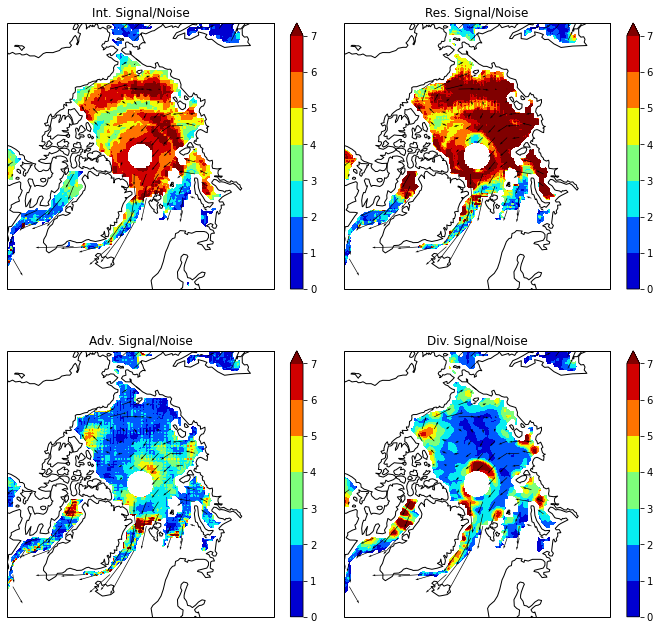

In [242]:
#### Signal to noise average for Inputs
## time to plot
t=slice(0,-1,2)
# t=slice(100,101)
# t=45
# # t=slice(6,12)
# # tlist = [slice(0,6),slice(6,12)]
# # labels = ['Growth','Melt']
# # tlist = [slice(t,t+1) for t in range(6)]
# tlist = [slice(t,t+1) for t in range(6,12)]
# labels = [bud1.dates[t][0].strftime('%b %Y') for t in tlist] 
# fig = plt.figure(figsize=(5*len(tlist),5))
# for pn,(t,lab) in enumerate(zip(tlist,labels)):
#     ax = fig.add_subplot(1,len(tlist),pn+1,projection=m)
#     ax = ba.plot_single(np.nanmean(bud1.old_ice[t]+bud1.new_ice[t],axis = 0),np.arange(-0.1,0.11,0.01),G,
#                         vecx = np.nanmean(bud1.ice_drift_x[t],axis = 0),
#                         vecy = np.nanmean(bud1.ice_drift_y[t],axis = 0),
#                         rvGplot=G2Gplot,return_ax = True,give_ax=ax,
#                         label='new/old ice (m)',cmap = plt.cm.RdBu)
#     ax.set_title(lab)
# fig.subplots_adjust(hspace=0.05,wspace=0.02)
# fig.savefig(save_dir+'new_old_ice_'+'_'.join([labels[0],labels[-1]]).replace(' ','-')+'.png',bbox_inches='tight')
# fig.show()

# points = [[-30,75],[120,75],[0,90]] ## central barents
# points = [[0,75],[60,75],[0,86]] ### zoom barents edge #### force map to include these points
# points = [[-175,72],[-140,68],[-160,86]] ## Beaufort ish
# lims = GV.lims_from_lonlat(points,for_extent = True)
lmax = 8.0
level_list = [
    np.arange(0.0,lmax,1.0)
]*4
arr_list = [
    np.abs(bud1.intensification[t])/ np.sqrt(bud1.int_sig[t]),
    np.abs(bud1.residual[t])/ np.sqrt(bud1.res_sig[t]),
    np.abs(bud1.advection[t])/ np.sqrt(bud1.adv_sig[t]),
    np.abs(bud1.divergence[t])/ np.sqrt(bud1.div_sig[t]),
]
cmap_list = [
    plt.cm.jet
]*4
lab_list = ['Int. Signal/Noise',
           'Res. Signal/Noise',
           'Adv. Signal/Noise',
           'Div. Signal/Noise',
           ]
# xv,yv = G2Gplot.rg_vecs(bud.ice_drift_x[t],bud.ice_drift_y[t])
xv,yv = G2Gplot.rg_vecs(
    np.nanmean(bud.ice_drift_x[t],axis=0),
    np.nanmean(bud.ice_drift_y[t],axis=0),
    )
#### plot concentration (vel grid)
f = plt.figure(figsize=( 12,12))
for ns,(arr,levels,cmap,lab) in enumerate(zip(arr_list,level_list,cmap_list,lab_list)):
    ax = f.add_subplot(2,2,ns+1,projection=m)
#     ax.set_extent(lims,m)
    ax.set_extent([-180, 180, 60, 90], ccrs.PlateCarree())
    # s = ax.contourf(Gthk.xpts,Gthk.ypts,Tslices[0],levels = levels)
    arr = np.nanmean(arr,axis = 0)
    s = ax.contourf(G.xpts,G.ypts,arr,levels = levels,
                    cmap = cmap,extend='max')
    ax.quiver(Gplot.xpts,Gplot.ypts,xv,yv,scale = 1.0)
    ax.add_feature(cfeature.COASTLINE)
    plt.colorbar(s,shrink=0.82)
    ax.set_title(lab)
    

plt.subplots_adjust(wspace=0.01,hspace=0.01)
plt.show()
# f.savefig(fig_dir+'Inputs_single_day.png',bbox_inches='tight')

In [65]:
lab_list = ['Int','Res','Adv','Div',]
sn_dict = {}
for name,arr in zip(lab_list,arr_list):
    sn_dict[name+'_mean'] = np.nanmean(arr[np.isfinite(arr)])
    for s in range(1,6):
        sn_dict[name+str(s)] = np.sum(arr>s)/np.sum(arr>0) 
sn_dict

{'Int_mean': 3.903021013608863,
 'Int1': 0.8981903154408369,
 'Int2': 0.7767591280393624,
 'Int3': 0.620631040906992,
 'Int4': 0.44588461967166126,
 'Int5': 0.2905248324071273,
 'Res_mean': 6.275978962145436,
 'Res1': 0.9278009500314636,
 'Res2': 0.8537363634844882,
 'Res3': 0.7713353343765488,
 'Res4': 0.6654842320393377,
 'Res5': 0.5574947235943043,
 'Adv_mean': 1.802596804022014,
 'Adv1': 0.578391769256048,
 'Adv2': 0.31918905937966074,
 'Adv3': 0.17405394474076696,
 'Adv4': 0.09991152455825476,
 'Adv5': 0.0578528274223312,
 'Div_mean': 2.526815965582358,
 'Div1': 0.5968353774022586,
 'Div2': 0.37410554927870837,
 'Div3': 0.2550692363533155,
 'Div4': 0.18620949386779323,
 'Div5': 0.14107077554540343}

In [66]:
t = slice(None)
t_use = slice(1,-1,2)
lab_list = ['Int','Res','Adv','Div',]
arr_list = [
    np.abs(bud1.intensification[t])/ np.sqrt(bud1.int_sig[t]),
    np.abs(bud1.residual[t])/ np.sqrt(bud1.res_sig[t]),
    np.abs(bud1.advection[t])/ np.sqrt(bud1.adv_sig[t]),
    np.abs(bud1.divergence[t])/ np.sqrt(bud1.div_sig[t]),
]
rg_sn_dict = {}
for rg in regions:
    bud1.mask=False
    rg_int= rg['N_ints']
    bud1.build_static_mask(
        np.isin(NG2G.rg_array(Nmask,method='nearest'),rg_int))
    for name,arr in zip(lab_list,arr_list):
        arr[np.isinf(arr)] = np.nan
        bud1.data = arr
        rg_sn_dict[name+rg['label']+'_mean'] = np.nanmean(bud1[t_use])
        for s in range(1,6):
            rg_sn_dict[name+rg['label']+str(s)] = np.sum(bud1[t_use]>s)/np.sum(bud1[t_use]>0) 
# rg_sn_dict

Building new mask array
Building new mask array
Building new mask array
Building new mask array
Building new mask array
Building new mask array
Building new mask array


In [67]:
### makes a table, copy paste it into a tex file
from tabulate import tabulate

# rows = Int,Adv,Div,Res
lab_list = [ 'Int','Adv','Div','Res',]
#Cols, for each sn>s, mean sn
##    Daily 2015
##    Monthly
##    Growth
##    Melt
s = 3
rows = [[nm]+[rg['label'].replace('_',', ')]+["{:.2f}".format(d_pd[dvar+rg['label']+'_mean'])+' '+"{:.1f}".format(d_pd[dvar+rg['label']+str(s)]*100) 
         for dvar in lab_list] 
         for nm,d_pd in zip(['This data'],[rg_sn_dict])
         for rg in regions] 
   

print(tabulate(rows,
           headers=['']+['Region']+lab_list
               , tablefmt='fancy_grid'))

╒═══════════╤════════════════════════╤═══════════╤═══════════╤═══════════╤═══════════╕
│           │ Region                 │ Int       │ Adv       │ Div       │ Res       │
╞═══════════╪════════════════════════╪═══════════╪═══════════╪═══════════╪═══════════╡
│ This data │ Basin                  │ 3.37 58.6 │ 1.20 5.6  │ 1.02 4.3  │ 4.10 65.2 │
├───────────┼────────────────────────┼───────────┼───────────┼───────────┼───────────┤
│ This data │ Beaufort, Chukchi      │ 3.51 61.0 │ 1.40 8.3  │ 1.03 4.2  │ 4.63 73.3 │
├───────────┼────────────────────────┼───────────┼───────────┼───────────┼───────────┤
│ This data │ Siberian, Laptev, Kara │ 3.41 59.3 │ 1.08 5.0  │ 0.96 3.5  │ 4.26 64.9 │
├───────────┼────────────────────────┼───────────┼───────────┼───────────┼───────────┤
│ This data │ Central                │ 3.44 61.2 │ 1.19 4.5  │ 0.98 3.2  │ 3.78 63.1 │
├───────────┼────────────────────────┼───────────┼───────────┼───────────┼───────────┤
│ This data │ Barents                │ 1.41

In [256]:
import pickle
# create a binary pickle file 
f = open("region_season_melt_sn.pkl","wb")
# f = open("region_season_growth_sn.pkl","wb")
pickle.dump(rg_sn_dict,f)
f.close()

In [18]:
bud1.dates[1]


datetime.datetime(2011, 10, 1, 0, 0)

In [472]:
tlist = [slice(4,5),slice(5,6),slice(16,17),slice(17,18),slice(0,None,2),slice(1,None,2)]
[bud1.dates[t] for t in tlist]

[[datetime.datetime(2013, 4, 1, 0, 0)],
 [datetime.datetime(2013, 10, 1, 0, 0)],
 [datetime.datetime(2019, 4, 1, 0, 0)],
 [datetime.datetime(2019, 10, 1, 0, 0)],
 [datetime.datetime(2011, 4, 1, 0, 0),
  datetime.datetime(2012, 4, 1, 0, 0),
  datetime.datetime(2013, 4, 1, 0, 0),
  datetime.datetime(2014, 4, 1, 0, 0),
  datetime.datetime(2015, 4, 1, 0, 0),
  datetime.datetime(2016, 4, 1, 0, 0),
  datetime.datetime(2017, 4, 1, 0, 0),
  datetime.datetime(2018, 4, 1, 0, 0),
  datetime.datetime(2019, 4, 1, 0, 0),
  datetime.datetime(2020, 4, 1, 0, 0),
  datetime.datetime(2021, 4, 1, 0, 0),
  datetime.datetime(2022, 4, 1, 0, 0)],
 [datetime.datetime(2011, 10, 1, 0, 0),
  datetime.datetime(2012, 10, 1, 0, 0),
  datetime.datetime(2013, 10, 1, 0, 0),
  datetime.datetime(2014, 10, 1, 0, 0),
  datetime.datetime(2015, 10, 1, 0, 0),
  datetime.datetime(2016, 10, 1, 0, 0),
  datetime.datetime(2017, 10, 1, 0, 0),
  datetime.datetime(2018, 10, 1, 0, 0),
  datetime.datetime(2019, 10, 1, 0, 0),
  datetim

/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: RuntimeWarning: Mean of empty slice
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:30: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


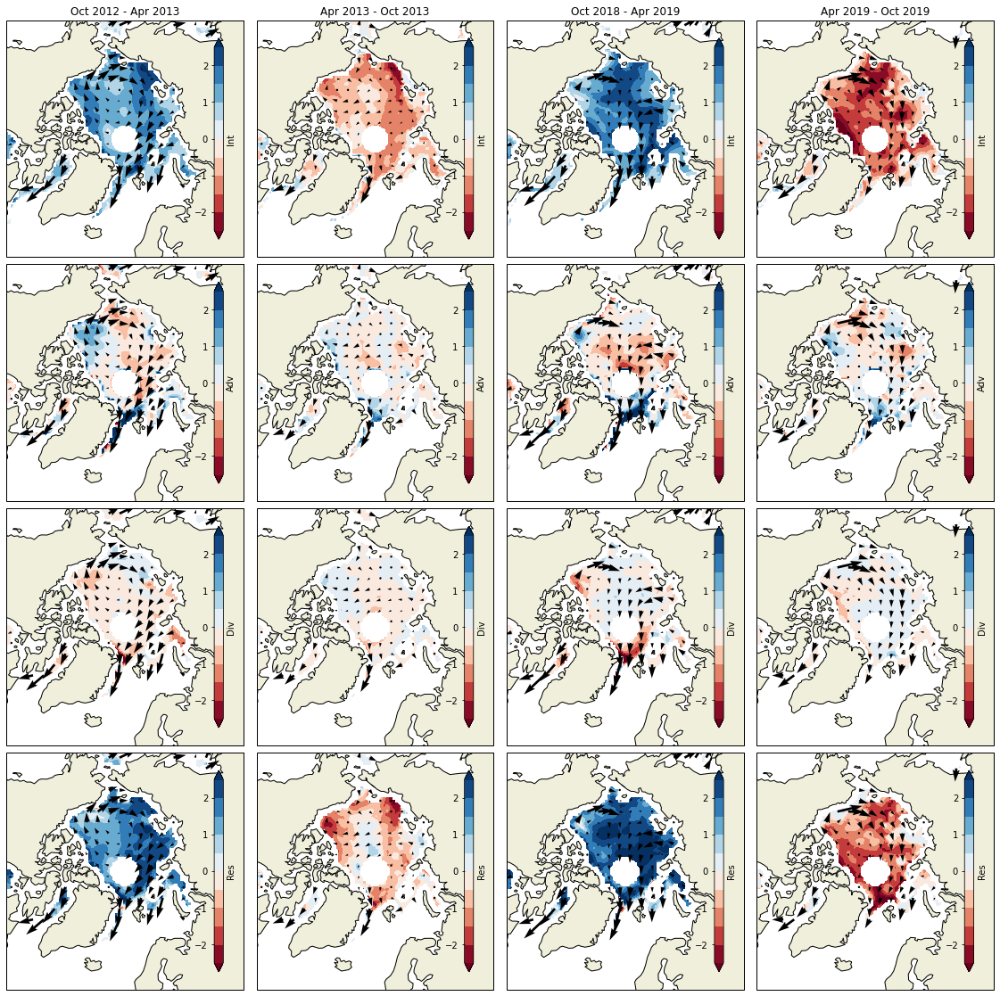

In [476]:
row_vars = [bud1.intensification,bud1.advection,bud1.divergence,bud1.residual,]
row_labs = ['Int','Adv','Div','Res',]
# row_rngs = [np.arange(-2.0,2.2,0.2)]*4
row_rngs = [np.arange(-2.5,3.0,0.5)]*4
row_maps = [plt.cm.RdBu]*4
# tlist = [slice(t,t+1) for t in range(6)]
# tlist = [slice(t,t+1) for t in range(bud1.nyrs)]
tlist = [slice(0,bud1.n_t-1,2),slice(1,bud1.n_t-1,2),]
tlist = [slice(0,bud1.n_t-1,2),slice(1,bud1.n_t-1,2),]
# labels = [bud1.dates[t][0].strftime('%b %Y')+' - '+(bud1.dates[t][-1]).strftime('%b %Y') for t in tlist] 
# tlist = [slice(2,3),slice(8,9),slice(0,12)]
tlist = [slice(4,5),slice(5,6),slice(16,17),slice(17,18),slice(0,None,2),slice(1,None,2)]
tlist = [slice(4,5),slice(5,6),slice(16,17),slice(17,18)]
labels = [(bud1.dates[t][0]+relativedelta(months=-6)).strftime('%b %Y')+' - '+(bud1.dates[t][0]).strftime('%b %Y') for t in tlist[:4]] 
labels = labels+['Mean Growth','Mean Melt']
# labels = ['Growth Season', 'Melt Season'] 
fig = plt.figure(figsize=(5*len(tlist),5*len(row_vars)))
for rn,(rv,rl,rr,rm) in enumerate(zip(row_vars,row_labs,row_rngs,row_maps)):
    for pn,(t,lab) in enumerate(zip(tlist,labels)):
        if rn >0: lab = ''
        ax = fig.add_subplot(len(row_vars),len(tlist),rn*len(tlist)+pn+1,projection=m)
        ax = ba.plot_single(np.nanmean(rv[t]*G.mask,axis = 0),rr,G,
                            vecx = np.nanmean(bud1.ice_drift_x[t],axis = 0),
                            vecy = np.nanmean(bud1.ice_drift_y[t],axis = 0),
                            rvGplot=G2Gplot,return_ax = True,give_ax=ax,
                            label=rl,cmap = rm)
        ax.set_title(lab)
fig.subplots_adjust(hspace=0.03,wspace=0.02)
fig.savefig(save_dir+'new_old_ice_NOMEAN_'+'_'.join([labels[0],labels[-1]]).replace(' ','-')+'.png',bbox_inches='tight')
fig.show()

In [477]:

save_dir+'all_months_'+'_'.join([labels[0],labels[-1]]+row_labs).replace('.','-').replace(' ','-')+'.png'

'/Users/h/PREMELT/Budget/Outputs/Outputs_2023_08_17/out_OSISAF_nt_Bristol_full_smooth/GrowMelt_EASE_NH/all_months_Oct-2012---Apr-2013_Mean-Melt_Int_Adv_Div_Res.png'

/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:16: RuntimeWarning: Mean of empty slice
  app.launch_new_instance()
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: Mean of empty slice
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: Mean of empty slice
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:24: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


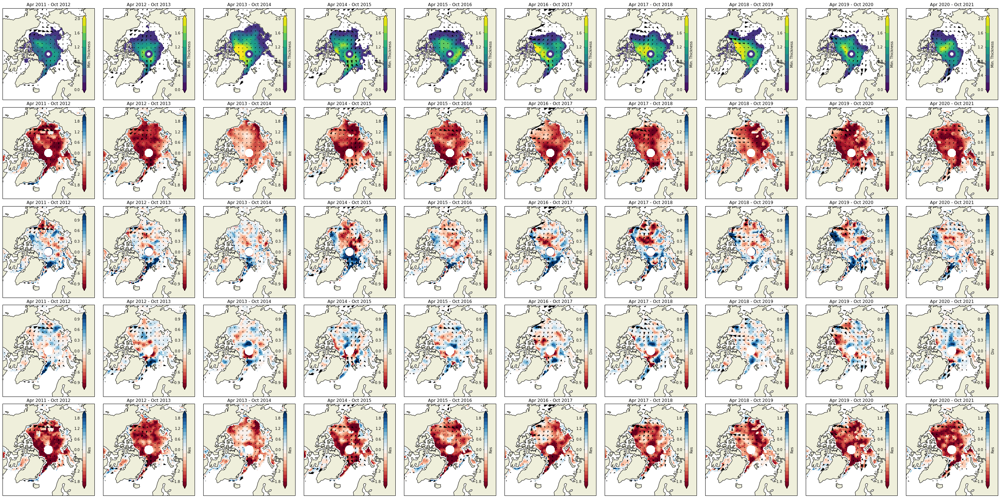

In [437]:
# row_vars = [bud1.inst_thickness,bud1.intensification,bud1.residual,]
# row_labs = ['Max. Thickness','Int','Res',]
row_vars = [bud1.inst_thickness,bud1.intensification,bud1.advection,bud1.divergence,bud1.residual,]
row_labs = ['Min. Thickness','Int','Adv','Div','Res',]
row_rngs = [np.arange(0.0,2.2,0.2),np.arange(-2.0,2.2,0.2),np.arange(-1.0,1.1,0.1),np.arange(-1.0,1.1,0.1),np.arange(-2.0,2.2,0.2)]
row_maps = [plt.cm.viridis,plt.cm.RdBu,plt.cm.RdBu,plt.cm.RdBu,plt.cm.RdBu]
# tlist = [slice(t,t+1) for t in range(6)]
tlist = [slice(t,t+1) for t in range(1,bud1.n_t-1,2)]
# labels = [bud1.dates[t][0].strftime('%b %Y')+' - '+(bud1.dates[t][0]+relativedelta(years=1)).strftime('%b %Y') for t in tlist] 
labels = [bud1.dates[np.abs(t.start-1)].strftime('%b %Y')+' - '+(bud1.dates[t.start]+relativedelta(years=1)).strftime('%b %Y') for t in tlist] 
# labels = [bud1.dates[t][0].strftime('%b %Y') for t in tlist] 
fig = plt.figure(figsize=(5*len(tlist),5*len(row_vars)))
for rn,(rv,rl,rr,rm) in enumerate(zip(row_vars,row_labs,row_rngs,row_maps)):
    for pn,(t,lab) in enumerate(zip(tlist,labels)):
        ax = fig.add_subplot(len(row_vars),len(tlist),rn*len(tlist)+pn+1,projection=m)
        ax = ba.plot_single(np.nanmean(rv[t],axis = 0),rr,G,
                            vecx = np.nanmean(bud1.ice_drift_x[t],axis = 0),
                            vecy = np.nanmean(bud1.ice_drift_y[t],axis = 0),
                            rvGplot=G2Gplot,return_ax = True,give_ax=ax,
                            label=rl,cmap = rm)
        ax.set_title(lab)
fig.subplots_adjust(hspace=0.08,wspace=0.02)
fig.savefig(save_dir+'all_months_'+'_'.join([labels[0],labels[-1]]+row_labs).replace('.','-').replace(' ','-')+'.png',bbox_inches='tight')
fig.show()

/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:21: RuntimeWarning: Mean of empty slice
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: RuntimeWarning: Mean of empty slice
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:30: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


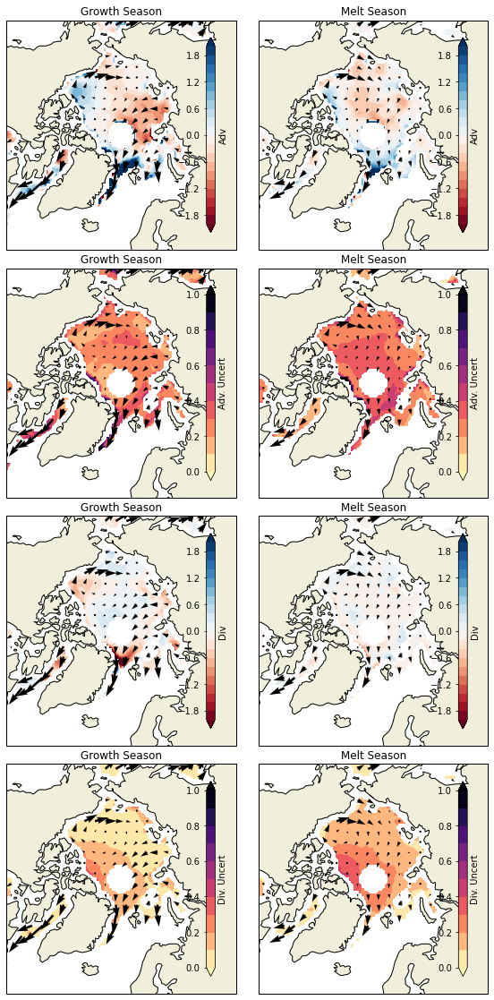

In [25]:
# row_vars = [bud1.intensification,np.sqrt(bud1.int_sig),bud1.residual,np.sqrt(bud1.res_sig),]
# row_labs = ['Int','Int. Uncert','Res','Res. Uncert',]
row_vars = [bud1.advection,np.sqrt(bud1.adv_sig),bud1.divergence,np.sqrt(bud1.div_sig),]
row_labs = ['Adv','Adv. Uncert','Div','Div. Uncert',]
# row_vars = [bud1.intensification,np.sqrt(bud1.int_sig),bud1.advection,np.sqrt(bud1.adv_sig),
#             bud1.divergence,np.sqrt(bud1.div_sig),bud1.residual,np.sqrt(bud1.res_sig),]
# row_labs = ['Int','Int. Uncert','Adv','Adv. Uncert','Div','Div. Uncert','Res','Res. Uncert',]
row_rngs = [np.arange(-2.0,2.2,0.2),np.arange(0.0,1.1,0.1)]*4
# row_rngs = [np.arange(-1.0,1.1,0.1),np.arange(0.0,1.1,0.1)]*4
row_maps = [plt.cm.RdBu,plt.cm.magma_r]*4
# tlist = [slice(t,t+1) for t in range(6)]
# tlist = [slice(t,t+1) for t in range(bud1.nyrs)]
tlist = [slice(0,bud1.n_t-1,2),slice(1,bud1.n_t-1,2),]
labels = ['Growth Season', 'Melt Season'] 
# labels = [bud1.dates[t][0].strftime('%b %Y')+' - '+(bud1.dates[t][0]+relativedelta(years=1)).strftime('%b %Y') for t in tlist] 
fig = plt.figure(figsize=(5*len(tlist),5*len(row_vars)))
for rn,(rv,rl,rr,rm) in enumerate(zip(row_vars,row_labs,row_rngs,row_maps)):
    for pn,(t,lab) in enumerate(zip(tlist,labels)):
        ax = fig.add_subplot(len(row_vars),len(tlist),rn*len(tlist)+pn+1,projection=m)
#         ax = ba.plot_single(np.nansum(rv[t],axis = 0),rr,G,
        ax = ba.plot_single(np.nanmean(rv[t]*G.mask,axis = 0),rr,G,
#         ax = ba.plot_single(rv[t][0],rr,G,
                            vecx = np.nanmean(bud1.ice_drift_x[t],axis = 0),
                            vecy = np.nanmean(bud1.ice_drift_y[t],axis = 0),
                            rvGplot=G2Gplot,return_ax = True,give_ax=ax,
                            label=rl,cmap = rm)
        ax.set_title(lab)
fig.subplots_adjust(hspace=0.08,wspace=0.02)
fig.savefig(save_dir+'new_old_ice_'+'_'.join([labels[0],labels[-1]]+row_labs).replace('.','-').replace(' ','-')+'.png',bbox_inches='tight')
fig.show()

/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in true_divide
  """Entry point for launching an IPython kernel.
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:15: RuntimeWarning: Mean of empty slice
  from ipykernel import kernelapp as app
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:16: RuntimeWarning: Mean of empty slice
  app.launch_new_instance()
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: Mean of empty slice
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


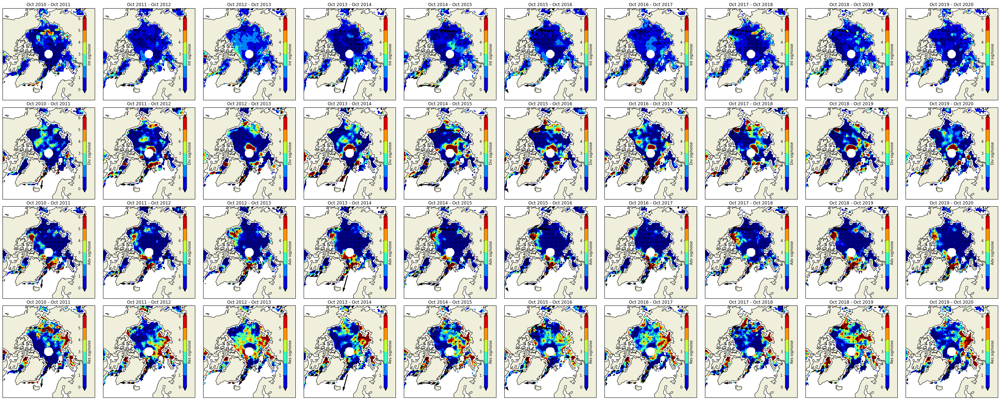

In [33]:
row_vars = [bud1.intensification/np.sqrt(bud1.int_sig),
            bud1.divergence/np.sqrt(bud1.div_sig),
            bud1.advection/np.sqrt(bud1.adv_sig),
            bud1.residual/np.sqrt(bud1.res_sig),]
row_labs = ['Int sig/noise','Div sig/noise','Adv sig/noise','Res sig/noise',]
row_rngs = [np.arange(0.0,7.0,1.0)]*4
row_maps = [plt.cm.jet]*4
# tlist = [slice(t,t+1) for t in range(6)]
tlist = [slice(t,t+1) for t in range(bud1.nyrs)]
labels = [bud1.dates[t][0].strftime('%b %Y')+' - '+(bud1.dates[t][0]+relativedelta(years=1)).strftime('%b %Y') for t in tlist] 
fig = plt.figure(figsize=(5*len(tlist),5*len(row_vars)))
for rn,(rv,rl,rr,rm) in enumerate(zip(row_vars,row_labs,row_rngs,row_maps)):
    for pn,(t,lab) in enumerate(zip(tlist,labels)):
        ax = fig.add_subplot(len(row_vars),len(tlist),rn*len(tlist)+pn+1,projection=m)
        ax = ba.plot_single(np.nanmean(rv[t],axis = 0),rr,G,
                            vecx = np.nanmean(bud1.ice_drift_x[t],axis = 0),
                            vecy = np.nanmean(bud1.ice_drift_y[t],axis = 0),
                            rvGplot=G2Gplot,return_ax = True,give_ax=ax,
                            label=rl,cmap = rm)
        ax.set_title(lab)
fig.subplots_adjust(hspace=0.08,wspace=0.02)
# fig.savefig(save_dir+'new_old_ice_'+'_'.join([labels[0],labels[-1]]).replace(' ','-')+'.png',bbox_inches='tight')
fig.show()

In [17]:
#### read NSIDC mask
mfile= '/Users/h/PREMELT/Budget/Michel_budget_plots/NSIDC_Regions_Masks.nc'
# mfile= '/Users/h/PREMELT/Budget/Michel_budget_plots/masks/mask_joint_int_clim_all.npy'
# mfile= '/Users/h/PREMELT/Budget/Michel_budget_plots/masks/mask_joint_int_months_100.npy'
Nmask = np.flipud(Dataset(mfile).variables['mask'][:].T)

rnames = [] 
for n,rn in enumerate(Dataset(mfile).variables['region_names'][:]):
    name = str(n+1)+': '
    for r in rn:
        name+=r.decode('UTF-8')
    rnames.append(name)
rnames

['1: Ice-free Oceans  ',
 '2: Sea of Okhotsk   ',
 '3: Bering           ',
 '4: Hudson Bay       ',
 '5: St John          ',
 '6: Baffin Bay       ',
 '7: East Greeland Sea',
 '8: Barents Sea      ',
 '9: Kara Sea         ',
 '10: Laptev Sea       ',
 '11: East Siberian Sea',
 '12: Chukchi Sea      ',
 '13: Beaufort Sea     ',
 '14: Canadian Islands ',
 '15: Central Arctic   ',
 '16: null             ',
 '17: null             ',
 '18: null             ',
 '19: null             ',
 '20: land             ',
 '21: land outline     ']

In [18]:
Ngrid  = gs.grid_set(m)
Ngrid.load_grid('grids/NSIDC_gs.npz')
NG2G = gs.Gs2Gs(Ngrid,G)
# NG2G2 = gs.Gs2Gs(Ngrid,G2)

Loaded a grid: grids/NSIDC_gs.npz


In [19]:
### fix baffin bay
Nmask[np.logical_and(Nmask==6,Ngrid.lats<67)] = 0

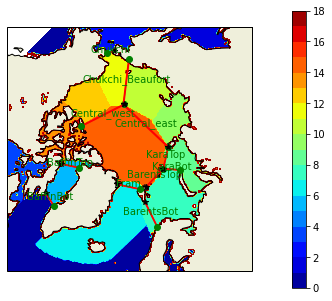

In [462]:
### all
fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(1,1,1,projection=m)
ax.set_extent([-180, 180, 60, 90], ccrs.PlateCarree())
s = ax.contourf(Ngrid.xpts, Ngrid.ypts,Nmask,
               levels = np.arange(0,19,1),cmap='jet')
# s = ax.pcolormesh(gm.G.xpts, gm.G.ypts,np.isin(Nmask,[2,3,4,5,6,7,8,9,10,11,12,13,14,15]))
# s = ax.pcolormesh(gm.G.xpts, gm.G.ypts,np.isin(Nmask,[8,9,10,11,12,13,14,15]))
# s = ax.pcolormesh(gm.G.xpts, gm.G.ypts,gm.mask[0])
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.COASTLINE)
# x,y = gm.G.mplot(lons_west,lats_west)
# ax.plot(x,y,'-m')
# x,y = gm.G.mplot(lons_east,lats_east)
# ax.plot(x,y,'-g')
for gd in Gate_data1:
#     if 'Fram' in gd.name:
    if '' in gd.name:
        ax.plot(gd.G.xpts,gd.G.ypts,'r') 
        ax.plot(gd.G.xpts[0,0],gd.G.ypts[0,0],'*k') 
        ax.plot(gd.G.xpts[-1,0],gd.G.ypts[-1,0],'og') 
        ax.text(gd.G.xpts.mean(),gd.G.ypts.mean(),gd.name,horizontalalignment='center',color='g')
cax = plt.colorbar(s,  pad=0.12,shrink= 0.85)

In [463]:
[[gl.name,gn] for gn,gl in enumerate(Gate_data1)]

[['Fram', 0],
 ['BarentsBot', 1],
 ['BarentsTop', 2],
 ['KaraTop', 3],
 ['KaraBot', 4],
 ['Chukchi', 5],
 ['BaffinTop', 6],
 ['BaffinBot', 7],
 ['Central_east', 8],
 ['Central_west', 9],
 ['Chukchi_Beaufort', 10]]

In [464]:
regions = [
    {'N_ints':[8,9,10,11,12,13,15],'label':'Basin',
    'gates':[Gate_data1[i]for i in [0,5]],
    'gates_sign':[1.,1.],
    'seas_ticks':[-10,-5,0,5,10],
    'seas_lim':11.5},
    {'N_ints':[12,13],'label':'Beaufort_Chukchi',
    'gates':[Gate_data1[i]for i in [9,10]],
    'gates_sign':[-1.,1.],
    'seas_ticks':[-2,-1,0,1,2],
    'seas_lim':2.5},
    {'N_ints':[9,10,11],'label':'Siberian_Laptev_Kara',
    'gates':[Gate_data1[i]for i in [4,8,10]],
    'gates_sign':[-1,-1.,-1.],
    'seas_ticks':[-4,-3,-2,-1,0,1,2,3,4],
    'seas_lim':5.0},
    {'N_ints':[15],'label':'Central',
    'gates':[Gate_data1[i]for i in [0,2,3,8,9]],
    'gates_sign':[1.,1.,1.,1.,1.],
    'seas_ticks':[-4,-3,-2,-1,0,1,2,3,4],
    'seas_lim':5.0},
#     {'N_ints':[10,11],'label':'Siberian_Laptev'},
#     {'N_ints':[9],'label':'Kara'},
    {'N_ints':[8],'label':'Barents',
    'gates':[Gate_data1[i]for i in [1,2,4]],
    'gates_sign':[-1.,-1.,-1.],
    'seas_ticks':[-0.6,-0.4,-0.2,0.0,0.2,0.4,0.6],
    'seas_lim':0.6},
    {'N_ints':[7],'label':'Greenland',
    'gates':[Gate_data1[i]for i in [0]],
    'gates_sign':[-1.],
    'seas_ticks':[-1.0,-0.5,0.0,0.5,1.0],
    'seas_lim':1.45},
    {'N_ints':[6],'label':'Baffin',
    'gates':[Gate_data1[i]for i in [7]],
    'gates_sign':[1.],
    'seas_ticks':[-0.6,-0.4,-0.2,0.0,0.2,0.4,0.6],
    'seas_lim':0.75},
#     {'N_ints':[6],'label':'Baffin'},
#     {'N_ints':[7],'label':'Greenland'},
]

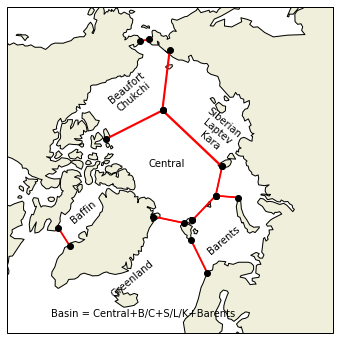

In [39]:
### all
fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(1,1,1,projection=m)
ax.set_extent([-180, 180, 60, 90], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.COASTLINE)
for rg in regions[1:]:
    rg_int= rg['N_ints']
    rg_mask = np.isin(NG2G.rg_array(Nmask,method='nearest'),rg_int)*np.isfinite(G.mask)
    xt = np.nanmean(G.xpts[rg_mask])
    yt = np.nanmean(G.ypts[rg_mask])
    rot=0
    if 'Sib' in rg['label']:
        rot = -40
    elif 'Cent' in rg['label']:
        rot = 0
    else:
        rot = 40
    ax.text(xt,yt,rg['label'].replace('_','\n'),horizontalalignment='center',
            color='k',rotation=rot,va='center')
    if rg['label'] == 'Greenland':
        ax.text(xt*0.7,yt*1.35,'Basin = Central+B/C+S/L/K+Barents'
                ,horizontalalignment='center',color='k')
for gd in Gate_data1:
#     if 'Fram' in gd.name:
    if 'BaffinTop' not in gd.name: 
#     if '' in gd.name:
        ax.plot(gd.G.xpts,gd.G.ypts,'r') 
        ax.plot(gd.G.xpts[0,0],gd.G.ypts[0,0],'ok') 
        ax.plot(gd.G.xpts[-1,0],gd.G.ypts[-1,0],'ok') 
#         ax.text(gd.G.xpts.mean(),gd.G.ypts.mean(),gd.name,horizontalalignment='center',color='g')
# cax = plt.colorbar(s,  pad=0.12,shrink= 0.85)

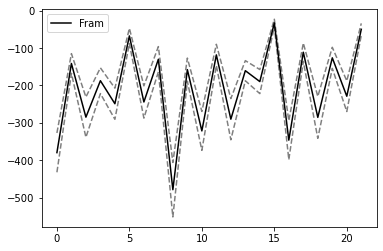

In [121]:
# gl = Gate_data1[0]
for gl in Gate_data1[:1]:
    pvec = np.nansum(gl.transport_y*gl.G.xdist[None,:,:],axis=(1,2))/2*1e-9
    psig = np.nansum(np.sqrt(gl.trans_y_sig)*gl.G.xdist[None,:,:],axis=(1,2))/2*1e-9
#     psig = np.sqrt(np.nansum(gl.trans_y_sig*gl.G.xdist[None,:,:],axis=(1,2))/2)*1e-9
    plt.plot(pvec,'-k',label=gl.name)
    plt.plot(pvec-psig,'--k',alpha=0.5)
    plt.plot(pvec+psig,'--k',alpha=0.5)
plt.legend()
plt.show()

Building new mask array


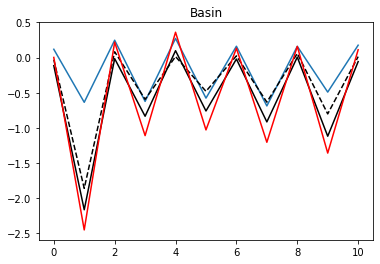

Building new mask array


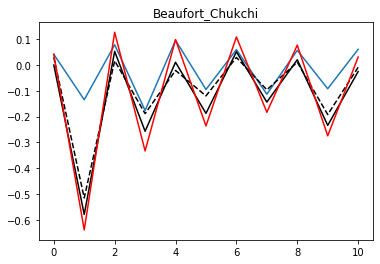

Building new mask array


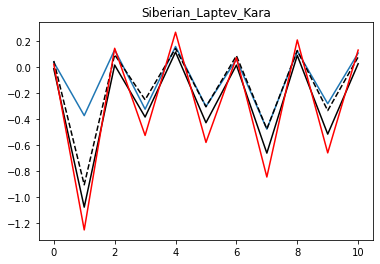

Building new mask array


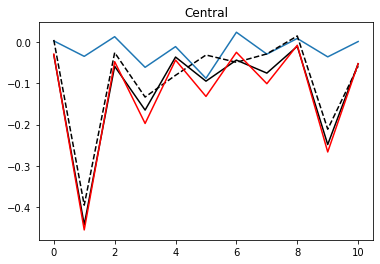

Building new mask array


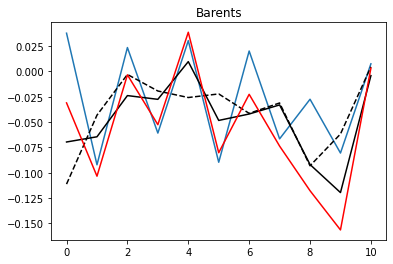

Building new mask array


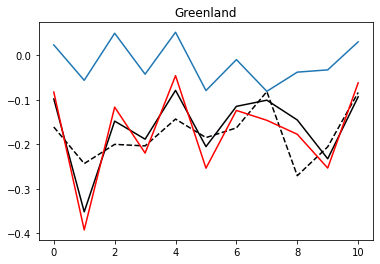

In [259]:
for rg in regions:
    bud1.mask=False
    rg_int= rg['N_ints']
    bud1.build_static_mask(
        np.isin(NG2G.rg_array(Nmask,method='nearest'),rg_int)*np.isfinite(G.mask))
    bud1.data = bud1.new_ice+bud1.old_ice
    plt.plot([np.nansum(bud1[y]*G.area[None,:,:]*pscale)
              for y in range(bud1.nyrs)])
    bud1.data = bud1.int_t
    plt.plot([np.nansum(bud1[y]*G.area[None,:,:]*pscale)
              for y in range(bud1.nyrs)],'-k')
    bud1.data = bud1.res_t
    plt.plot([np.nansum(bud1[y]*G.area[None,:,:]*pscale)
              for y in range(bud1.nyrs)],'--k')
    bud1.data = bud1.int_t + bud1.new_ice+bud1.old_ice
    plt.plot([np.nansum(bud1[y]*G.area[None,:,:]*pscale)
              for y in range(bud1.nyrs)],'-r')
    plt.title(rg['label'])
    plt.show()

In [45]:
Bt = bi.Bristol_thickness_seasonal('../Data/Bristol/80km_seasonal/')
GB = gs.grid_set(m)
GB.load_grid('grids/Bristol_nh_80km_gs.npz')
GB2G = gs.Gs2Gs(GB,G)

Loaded a grid: grids/Bristol_nh_80km_gs.npz


In [46]:
Bt.get_dates(dt.datetime(2010,10,15),dt.datetime(2011,10,15))
Bt.dates[:3]
min2010 = GB2G.rg_array(Bt.get_hi([dt.datetime(2010,10,25)]))


Bristol_hi_seasonal Found 260 dates


In [47]:
min_vol = np.nansum(bud1.inst_thickness*G.area[None,:,:]*G.mask,axis=(1,2))*pscale
np.nansum(min2010*G.area*G.mask)*pscale - min_vol[0],np.diff(min_vol)

(2.337258917259574,
 array([ 14.63149827, -14.33315669,  12.63673618, -12.59638508,
         10.67238795,  -8.50743513,  10.93252104, -11.861232  ,
         11.85115301, -12.08681586,   9.76400872,  -9.89513461,
         11.3723006 , -10.80078139,  10.19712086, -10.65769094,
         11.85767222, -12.36496119,  11.6900665 , -12.17779333,
          5.31296201]))

In [48]:
all_min = np.concatenate([np.expand_dims(min2010,0),bud1.inst_thickness],axis=0)

In [80]:
bud.mask=False
rg = regions[3]
ys = []
rg_int= rg['N_ints']
bud1.build_static_mask(
    np.isin(NG2G.rg_array(Nmask,method='nearest'),rg_int))
gspan = 1.0/(len(rg['gates']))/2*(1/6) ### gates individually (one column)
gcen = np.arange(gspan/2.0,1.0+gspan/2.0,gspan)+2/3
gcolors = [(b/2.0,b/1.5,b) for b in np.linspace(1.0,0.6,len(rg['gates']))]### RGB
for n, (var, cl) in enumerate(zip(pvar[:1],bcolors)):
    bud.set_var(var)
    plot_temp = bud.clim_mean(first_p=mstart,year_set=ys,method='ysum',mask=True,
                                mult_array=G.xdist*G.ydist*pscale,full_time = True)
    
    bud.set_var('int_sig')
    bud.data = np.sqrt(bud.data)
    plot_temps = bud.clim_mean(first_p=mstart,year_set=ys,method='ysum',mask=True,
                                mult_array=G.xdist*G.ydist*pscale,full_time = True)
    

Data year mask not set: ignoring it
Data year mask not set: ignoring it


In [23]:
bud=bud1
bud.MIZ = bud.old_ice + bud.new_ice + bud.int_t

Building new mask array


/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:65: RuntimeWarning: divide by zero encountered in true_divide


Building new mask array
Building new mask array
Building new mask array
Building new mask array
Building new mask array
Building new mask array
/Users/h/PREMELT/Budget/Outputs/Outputs_2023_11_01/out_Pathfinder_nt_Bristol_full_year/GrowMelt_EASE_NH/Full_time_bud_bars_SN_.pdf


/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:161: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


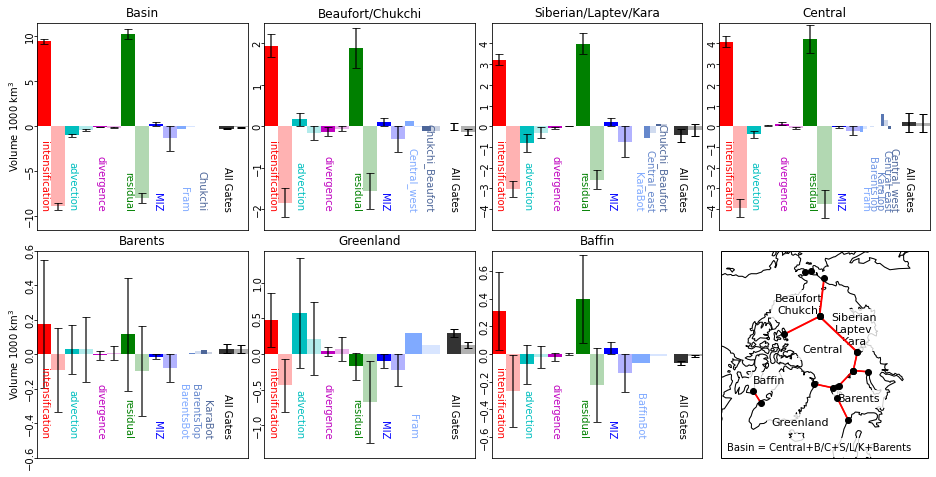

In [34]:
pvar = [
 'intensification',
 'advection',
 'divergence',
 'residual',
    'MIZ',
#  'dynamics',
#  'negative_divergence',
#  'positive_divergence',
]
evar = [
    'int_sig',
    'adv_sig',
    'div_sig',
    'res_sig',
    'int_t',
]
# ys = [2,2]
ys = []
if ys == []:
    plot_label = 'Full_time_bud_bars_SN_'
else:
    plot_label = '_'.join([str(bud.years[y]) for y in ys]+['bud_bars_'])
mstart = 9
pscale = 1e-12
plot_type='.pdf'
# rg = regions[2]
bcolors = ['r','c','m','g','b']
bspan = 1.0/(5)/2*(2/3) ### 2 columns per component 2/3 for budget
bcen = np.arange(bspan/2.0,1.0+bspan/2.0,bspan)
nr = 0
# ncols,nrows = (1,1) #### whole basin
# plot_label = 'Basin_'+plot_label 
# ncols,nrows = (2,3) #### 6 regions
ncols,nrows = (4,2) #### 7 regions
fig = plt.figure(figsize=(4*ncols,4*nrows))
# for rg in regions[:1]: ### basin
#     ax = fig.add_subplot(1,1,1)
for nr,rg in enumerate(regions[:]): ### 4 regions
#     ax = fig.add_subplot(3,2,nr+1)
    ax = fig.add_subplot(2,4,nr+1)
    bud.mask=False
    rg_int= rg['N_ints']
    bud.build_static_mask(
        np.isin(NG2G.rg_array(Nmask,method='nearest'),rg_int))
    gspan = 1.0/(len(rg['gates']))/2*(1/6) ### gates individually (one column)
    gcen = np.arange(gspan/2.0,1.0+gspan/2.0,gspan)+2/3
    gcolors = [(b/2.0,b/1.5,b) for b in np.linspace(1.0,0.6,len(rg['gates']))]### RGB
    for n, (var,var_s, cl) in enumerate(zip(pvar,evar,bcolors)):
        bud.set_var(var)
#         plot_temp = bud.clim_mean(first_p=mstart,year_set=ys,method='ysum',mask=True,
        plot_temp = bud.clim_mean(year_set=ys,method='ysum',mask=True,
                                    mult_array=G.xdist*G.ydist*pscale,full_time = True)
        ### bar the first 6, then second 6
        b = ax.bar(bcen[2*n],np.nansum(plot_temp[:1]),width=bspan,label = var,color=cl)
        ax.bar(bcen[2*n+1],np.nansum(plot_temp[1:]),width=bspan,color=cl,alpha=0.3)
        if var_s is not 'MIZ':
#             bud.set_var(var_s)
            ## S/N method
            b_signal = bud.data.copy()
            if var_s is not 'int_t':
#                 bud.data = np.sqrt(bud.data)
                ## S/N method
                bud.set_var(var_s)
                bud.data = np.abs(b_signal)/np.sqrt(bud.data)
                bud.data[np.isinf(bud.data)] = np.nan
            plot_temps = bud.clim_mean(year_set=ys,method='ysum',mask=True,
                                        mult_array=G.xdist*G.ydist*pscale,full_time = True)
            if var_s is not 'int_t':
                plot_temps = [p/ps for p,ps in zip(plot_temp,plot_temps)]
            plt.errorbar([bcen[2*n],bcen[2*n+1]],plot_temp,fmt='.k',markersize=0,alpha=0.8,
                         yerr=plot_temps,ecolor='k',capsize=4)
#     ymax = ax.get_ylim()[0]
    ymax = -rg['seas_lim']
    text_off = ymax*4/5
    ### loop again for labels
    for n, (var, cl) in enumerate(zip(pvar,bcolors)):
        ax.text(bcen[2*n]-bspan/3,text_off,var,rotation = -90,color = cl)
    all_gates_gr = []
    all_gates_ml = []
    all_gates_grs = []
    all_gates_mls = []
    for gn, (gl,gls,cl) in enumerate(zip(rg['gates'],rg['gates_sign'],gcolors)):
        bud.set_var(var)
        gl.set_var('transport_y')
        # bud.data *= np.array(bud.days_per_slice)[:,None,None]
        plot_temp = gl.clim_mean(method='ysum',full_time=True,year_set=ys,
                                       mult_array=gls*gl.G.xdist*pscale/2)
        ### bar the first 6, then second 6
        b = ax.bar(gcen[2*gn],np.nansum(plot_temp[:1]),width=gspan,label = var,color=cl)
        ax.bar(gcen[2*gn+1],np.nansum(plot_temp[1:]),width=gspan,label = var,color=cl,alpha=0.3)
        ax.text(gcen[2*gn]-gspan/3,text_off,gl.name,rotation = -90,color = cl)
        all_gates_gr.append(np.nansum(plot_temp[:1]))
        all_gates_ml.append(np.nansum(plot_temp[1:]))
        gl.set_var('trans_y_sig')
        gl.data = np.sqrt(gl.data)
        plot_temps = gl.clim_mean(year_set=ys,method='ysum',
                                    mult_array=gls*gl.G.xdist*pscale/2,full_time = True)
#         plt.errorbar([gcen[2*gn],gcen[2*gn+1]],plot_temp,fmt='.k',markersize=0,
#                      yerr=plot_temps,ecolor='k',capsize=4)
        all_gates_grs.append(plot_temps[0])
        all_gates_mls.append(plot_temps[1])
    b = ax.bar(bcen[-2],np.nansum(all_gates_gr),width=bspan,label = var,color='k',alpha=0.8)
    ax.bar(bcen[-1],np.nansum(all_gates_ml),width=bspan,label = var,color='k',alpha=0.3)
    plt.errorbar(bcen[-2],np.nansum(all_gates_gr),fmt='.k',markersize=0,
                 yerr=np.nansum(all_gates_grs),ecolor='k',capsize=4)
    plt.errorbar(bcen[-1],np.nansum(all_gates_ml),fmt='.k',markersize=0,
                 yerr=np.nansum(all_gates_mls),ecolor='k',capsize=4)
    ax.text(bcen[-2]-bspan/3,text_off,'All Gates',rotation = -90)
    ax.set_xlim([0.0,1.0])
    
#     if nr==1 or nr==3 or nr==5: ## 6plots
#     if nr==3 or nr==6: ## 7 plots
#         ax.yaxis.tick_right()
#         ax.yaxis.set_label_position("right")
#     ymax = ax.get_ylim()[0]
    ax.set_ylim([ymax,-ymax])
    ax.set_xticks([])
    ax.set_title(rg['label'].replace('_','/'))
#     ax.tick_params(axis='both', labelrotation = 90)
    plt.setp( ax.yaxis.get_majorticklabels(), rotation=90, ha="center", va="center", rotation_mode="anchor" )
    if nr==0 or nr==4: ## 7 plots
        ax.set_ylabel('Volume 1000 km$^3$')
#     if nr==1 or nr==2 or nr==5: ## 7 plots
#         ax.set_yticks([])
#         ax.set_ylabel('')
    if nr==5:## hard fix annoying tick labels
        ax.set_yticks([-1.0,-0.5,0.0,0.5,1.0])
    ax.set_yticks(rg['seas_ticks'])
ax = fig.add_subplot(2,4,8,projection=m)
ax.set_extent([-180, 180, 60, 90], ccrs.PlateCarree())
# ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.COASTLINE,zorder=0)
ax.add_feature(cfeature.COASTLINE,zorder=4,alpha=0.2)
for rg in regions[1:]:
    rg_int= rg['N_ints']
    rg_mask = np.isin(NG2G.rg_array(Nmask,method='nearest'),rg_int)*np.isfinite(G.mask)
    xt = np.nanmean(G.xpts[rg_mask])
    yt = np.nanmean(G.ypts[rg_mask])
    rot=0
#     if 'Sib' in rg['label']:
#         rot = -40
#     elif 'Cent' in rg['label']:
#         rot = 0
#     else:
#         rot = 40
    ax.text(xt,yt,rg['label'].replace('_','\n'),horizontalalignment='center',zorder= 1,
            color='k',rotation=rot,va='center',fontsize = 11,backgroundcolor = 'w')
    if rg['label'] == 'Greenland':
        ax.text(xt*0.2,yt*1.4,'Basin = Central+B/C+S/L/K+Barents',zorder= 3,
                horizontalalignment='center',color='k',backgroundcolor = 'w')
for gd in Gate_data1:
#     if 'Fram' in gd.name:
    if 'BaffinTop' not in gd.name:
        ax.plot(gd.G.xpts,gd.G.ypts,'r') 
        ax.plot(gd.G.xpts[0,0],gd.G.ypts[0,0],'ok',zorder= 3) 
        ax.plot(gd.G.xpts[-1,0],gd.G.ypts[-1,0],'ok',zorder= 3) 
fig.subplots_adjust(wspace=0.08, hspace=0.1)
fig.savefig(save_dir+plot_label+plot_type,bbox_inches='tight')
print(save_dir+plot_label+plot_type)
fig.show()

In [514]:
rg = regions[0]
var = 'residual'
var_s = 'int_sig'
bud.mask=False
rg_int= rg['N_ints']
bud.build_static_mask(
np.isin(NG2G.rg_array(Nmask,method='nearest'),rg_int))
bud.set_var(var)
#         plot_temp = bud.clim_mean(first_p=mstart,year_set=ys,method='ysum',mask=True,
plot_temp = bud.clim_mean(year_set=ys,method='ysum',mask=True,
                            mult_array=G.xdist*G.ydist*pscale,full_time = True)
bud.set_var(var_s)
bud.data = np.abs(b_signal)/np.sqrt(bud.data)
bud.data[np.isinf(bud.data)] = np.nan
plot_temps = bud.clim_mean(year_set=ys,method='ysum',mask=True,
                    mult_array=G.xdist*G.ydist*pscale,full_time = True)
plot_temps = [p/ps for p,ps in zip(plot_temp,plot_temps)]
plot_temp,plot_temps

Building new mask array


/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in true_divide
  del sys.path[0]


([10.210930780661874, -7.320555069893583],
 [1.1797234041310773, -1.9519272543613495])

In [71]:
bud1.dates

[datetime.datetime(2011, 4, 1, 0, 0),
 datetime.datetime(2011, 10, 1, 0, 0),
 datetime.datetime(2012, 4, 1, 0, 0),
 datetime.datetime(2012, 10, 1, 0, 0),
 datetime.datetime(2013, 4, 1, 0, 0),
 datetime.datetime(2013, 10, 1, 0, 0),
 datetime.datetime(2014, 4, 1, 0, 0),
 datetime.datetime(2014, 10, 1, 0, 0),
 datetime.datetime(2015, 4, 1, 0, 0),
 datetime.datetime(2015, 10, 1, 0, 0),
 datetime.datetime(2016, 4, 1, 0, 0),
 datetime.datetime(2016, 10, 1, 0, 0),
 datetime.datetime(2017, 4, 1, 0, 0),
 datetime.datetime(2017, 10, 1, 0, 0),
 datetime.datetime(2018, 4, 1, 0, 0),
 datetime.datetime(2018, 10, 1, 0, 0),
 datetime.datetime(2019, 4, 1, 0, 0),
 datetime.datetime(2019, 10, 1, 0, 0),
 datetime.datetime(2020, 4, 1, 0, 0),
 datetime.datetime(2020, 10, 1, 0, 0)]

Building new mask array
Building new mask array
Basin


/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:124: RuntimeWarning: divide by zero encountered in true_divide
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:171: RuntimeWarning: divide by zero encountered in true_divide


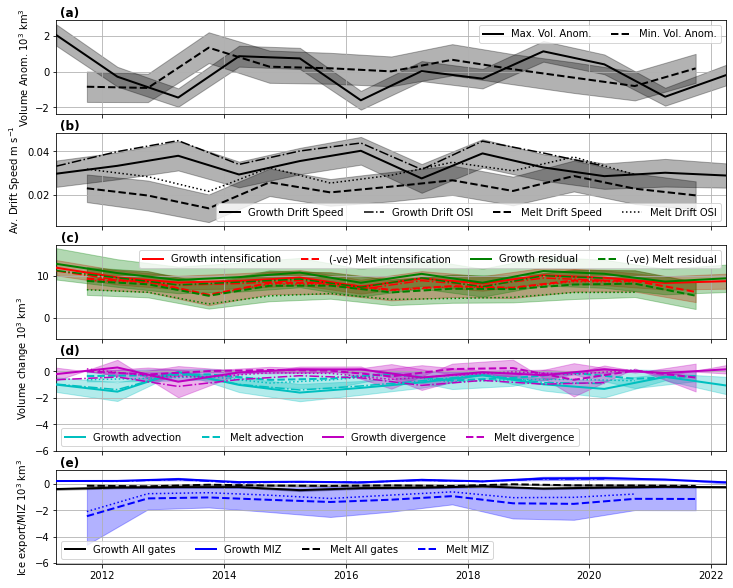

Building new mask array
Building new mask array
Beaufort_Chukchi


/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:124: RuntimeWarning: divide by zero encountered in true_divide
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:171: RuntimeWarning: divide by zero encountered in true_divide


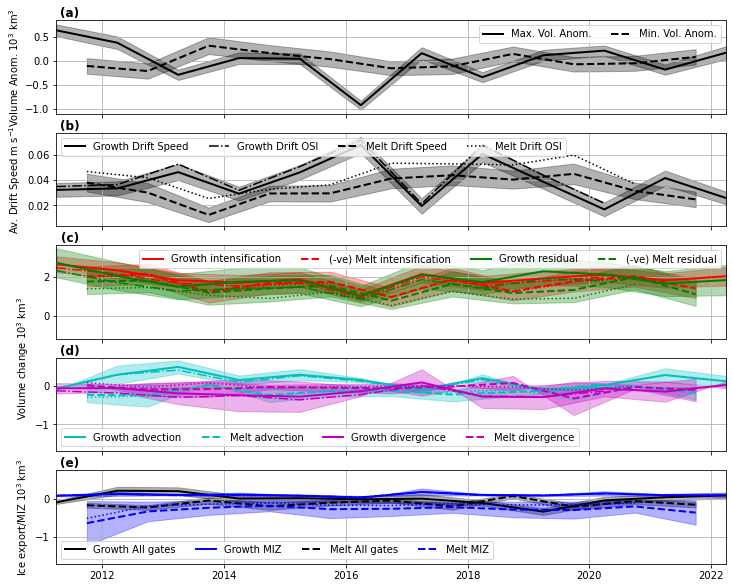

Building new mask array
Building new mask array
Siberian_Laptev_Kara


/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:124: RuntimeWarning: divide by zero encountered in true_divide
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:171: RuntimeWarning: divide by zero encountered in true_divide


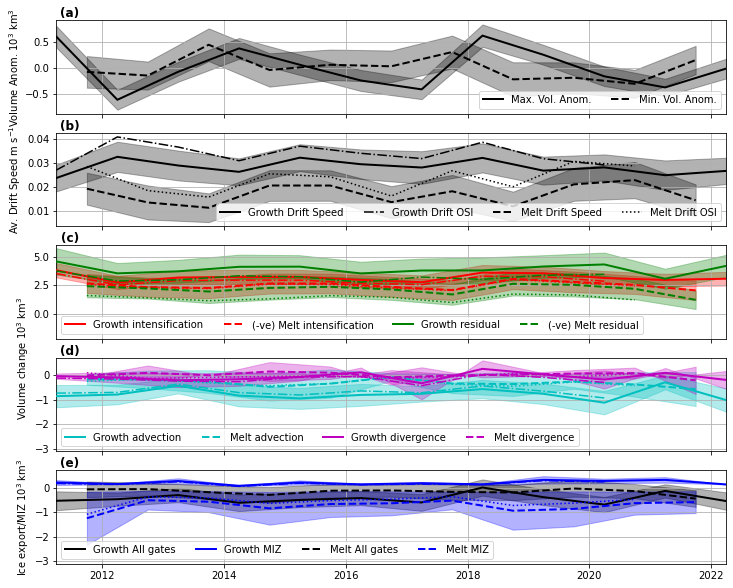

Building new mask array
Building new mask array
Central


/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:124: RuntimeWarning: divide by zero encountered in true_divide
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:171: RuntimeWarning: divide by zero encountered in true_divide


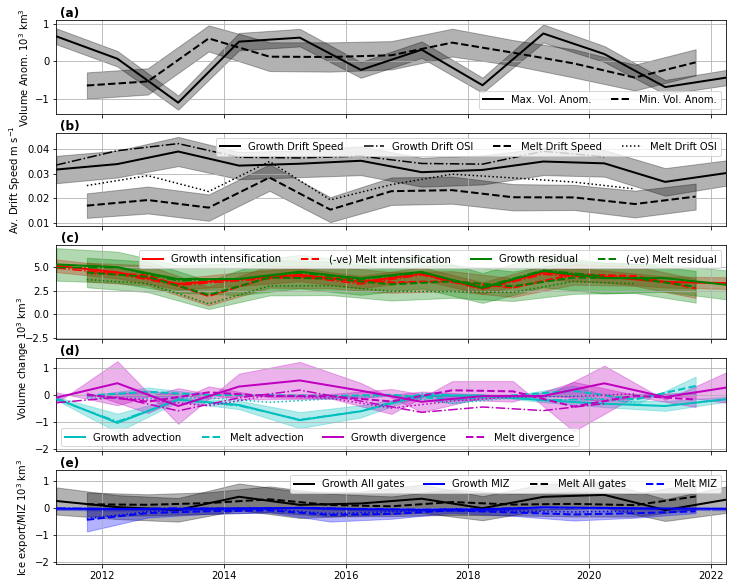

Building new mask array
Building new mask array
Barents


/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:124: RuntimeWarning: divide by zero encountered in true_divide
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:171: RuntimeWarning: divide by zero encountered in true_divide


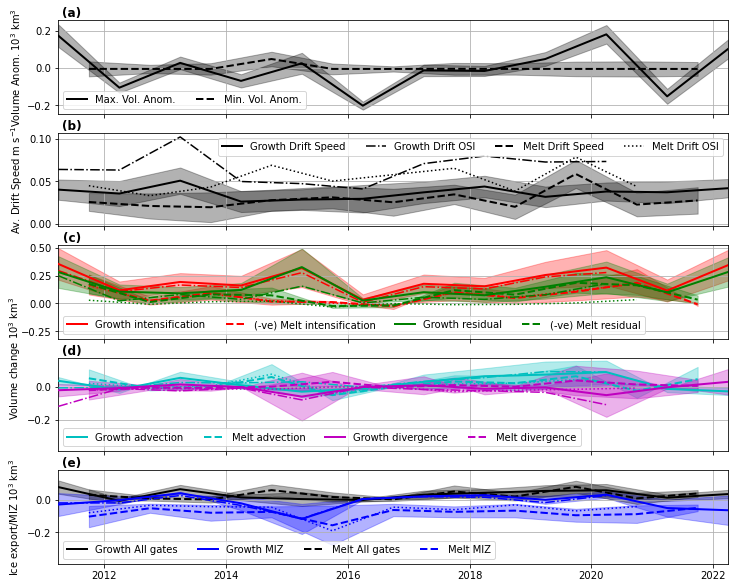

Building new mask array
Building new mask array
Greenland


/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:124: RuntimeWarning: divide by zero encountered in true_divide
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:171: RuntimeWarning: divide by zero encountered in true_divide


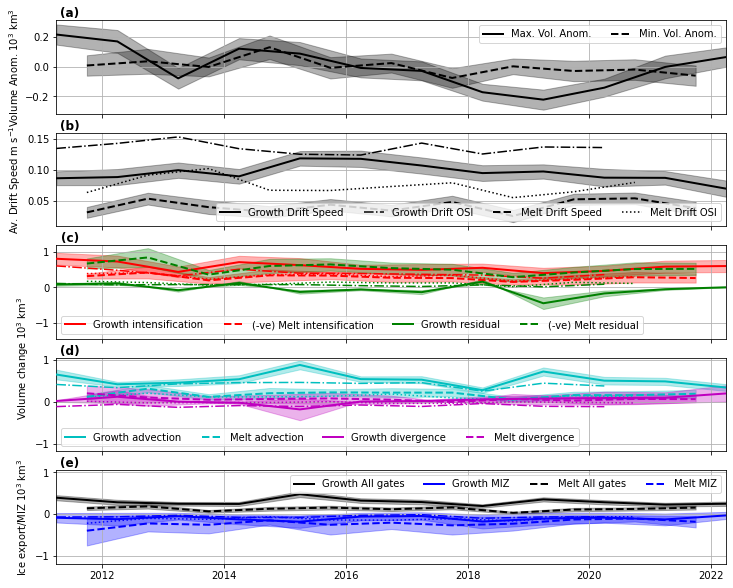

Building new mask array
Building new mask array


/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:124: RuntimeWarning: divide by zero encountered in true_divide
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:171: RuntimeWarning: divide by zero encountered in true_divide


Baffin


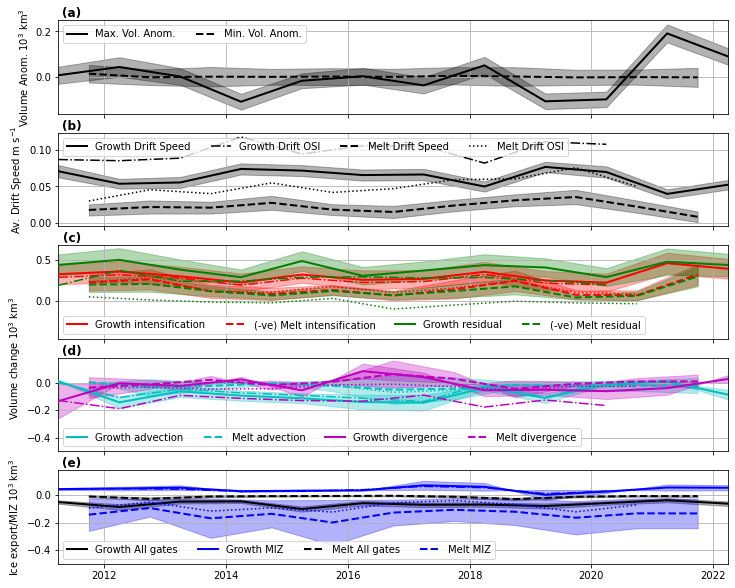

In [510]:
### seasonal: but growth - melt (under/over producing)
### grow: oct - march inclusive
### melt: apr - sept inclusive
### grow - melt
plot_type='.pdf'
plot_label = 'Growth_vs_melt_lines_EXTRA'
BUD2 = True
nrows = 5
ydim = 10
# years=[1,10]
years=[]
t_set=[]
# t_set=[3,20]
pscale = 1e-12
ax_d = []
ts = bud1.dates[0]
te = bud1.dates[-1]
for nr,rg in enumerate(regions[:]):
    f= plt.figure(figsize=(12,ydim))
    minmax_d = [0.0,0.0]
    ax_d = []
    bud1.mask=False
    rg_int= rg['N_ints']
    bud1.build_static_mask(
        np.isin(NG2G.rg_array(Nmask,method='nearest'),rg_int)*np.isfinite(G.mask))
    bud2.mask=False
    bud2.build_static_mask(
        np.isin(NG2G.rg_array(Nmask,method='nearest'),rg_int)*np.isfinite(G.mask))
    print(rg['label'])
    #### first plot, big variables, min/max thickness
    ax = f.add_subplot(nrows,1,1)
    ax.set_ylabel('Volume Anom. 10$^3$ km$^3$')
    ax.set_title('(a)',weight='bold',x=0.02,y=0.97)
    bud1.set_var('inst_thickness')
    
    dtemp,plot_temp = bud1.mean_series(periods= [0],method='sum',mult_array=G.area*pscale,mask=True)
    pt_mean = np.mean(plot_temp)
    plot_temp = [p-pt_mean for p in plot_temp]
    l, = ax.plot_date(dtemp,plot_temp,linestyle = '-',color = 'k',
                      marker='',linewidth= 2,label='Max. Vol. Anom.',zorder=3)
    bud1.set_var('Vol_sig')
    bud1.data = np.sqrt(bud1.data)
    dtemp,plot_temp_s = bud1.mean_series(periods= [0],method='sum',mult_array=G.area*pscale,mask=True)
    plot_temp_s2p = [p+ps for p,ps in zip(plot_temp,plot_temp_s)]
    plot_temp_s2m = [p-ps for p,ps in zip(plot_temp,plot_temp_s)]
    ax.fill_between(dtemp,plot_temp_s2p,plot_temp_s2m,color = 'k',alpha=0.3,zorder=1)
    bud1.set_var('inst_thickness')
    dtemp,plot_temp = bud1.mean_series(periods= [1],method='sum',mult_array=G.area*pscale,mask=True)
    pt_mean = np.mean(plot_temp)
    plot_temp = [p-pt_mean for p in plot_temp]
    l, = ax.plot_date(dtemp,plot_temp,linestyle = '--',color = 'k',
                      marker='',linewidth= 2,label='Min. Vol. Anom.',zorder=3)
    bud1.set_var('Vol_sig')
    bud1.data = np.sqrt(bud1.data)
    dtemp,plot_temp_s = bud1.mean_series(periods= [1],method='sum',mult_array=G.area*pscale,mask=True)
    plot_temp_s2p = [p+ps for p,ps in zip(plot_temp,plot_temp_s)]
    plot_temp_s2m = [p-ps for p,ps in zip(plot_temp,plot_temp_s)]
    ax.fill_between(dtemp,plot_temp_s2p,plot_temp_s2m,color = 'k',alpha=0.3,zorder=1)
    ax.legend(ncol=5)
    ax.set_xlim([ts,te])
    ax.set_xticklabels([])
    ax.grid(True,zorder=-1.0)
    
    
    ax = f.add_subplot(nrows,1,2)
    ax.set_ylabel('Av. Drift Speed m s$^{-1}$')
    ax.set_title('(b)',weight='bold',x=0.02,y=0.97)
#     bud1.data = np.hypot(bud1.U_sig,bud1.V_sig)
    for p,lab,ls in zip([0,1],['Growth','Melt'],['-','--']):
        bud1.data = np.hypot(bud1.ice_drift_x,bud1.ice_drift_y)
        dtemp,plot_temp = bud1.mean_series(periods= [p],method='mean',mask=True)
#         pt_mean = np.mean(plot_temp)
#         plot_temp = [p-pt_mean for p in plot_temp]
        plot_temp = [p*1 for p in plot_temp]
        l, = ax.plot_date(dtemp,plot_temp,linestyle = ls,color = 'k',
                          marker='',linewidth= 2,label=lab+' Drift Speed',zorder=3)
        if BUD2:
            if ls == '-': ls = '-.'
            if ls == '--': ls = ':'
            bud2.data = np.hypot(bud2.ice_drift_x,bud2.ice_drift_y)
            dtemp2,plot_temp2 = bud2.mean_series(periods= [p],method='mean',mask=True)
            l, = ax.plot_date(dtemp2,plot_temp2,linestyle = ls,color = 'k',
                              marker='',linewidth= 1.5,label=lab+' Drift OSI',zorder=3)    
        bud1.data = np.hypot(bud1.U_sig,bud1.V_sig)
        bud1.data = np.sqrt(bud1.data)
        dtemp,plot_temp_s = bud1.mean_series(periods= [p],method='mean',mask=True)
        plot_temp_s2p = [p+ps*1 for p,ps in zip(plot_temp,plot_temp_s)]
        plot_temp_s2m = [p-ps*1 for p,ps in zip(plot_temp,plot_temp_s)]
        ax.fill_between(dtemp,plot_temp_s2p,plot_temp_s2m,color = 'k',alpha=0.3,zorder=1)

#     l, = ax.plot_date(dtemp0,plot_temp0,linestyle = '-',color = 'k',
#                       marker='',linewidth= 2,label='Max. Vol. Anom.',zorder=3)
#     l, = ax.plot_date(dtemp1,plot_temp1,linestyle = '--',color = 'k',
#                       marker='',linewidth= 2,label='Max. Vol. Anom.',zorder=3)
    ax.legend(ncol=5)
    ax.set_xlim([ts,te])
    ax.set_xticklabels([])
    ax.grid(True,zorder=-1.0)
    
#     #### year seperation lines
    ax = f.add_subplot(nrows,1,3)
#     ax.set_ylabel('Volume change 10$^3$ km$^3$')
    ax.set_title('(c)',weight='bold',x=0.02,y=0.97)
    for n, (var,var_s, cl) in enumerate(zip(['intensification','residual'],
                                            ['int_sig','res_sig'],['r','g'])):
        for p,lab,ls,bsign in zip([0,1],['Growth','(-ve) Melt'],['-','--'],[1,-1]):
            bud1.set_var(var)
            dtemp,plot_temp = bud1.mean_series(periods= [p],method='sum',
                                               mult_array=G.area*pscale*bsign,mask=True)
#             pt_mean = np.mean(plot_temp)
#             plot_temp = [p-pt_mean for p in plot_temp]
            l, = ax.plot_date(dtemp,plot_temp,linestyle = ls,color = cl,
                              marker='',linewidth= 2,label=lab+' '+var,zorder=3)
            if BUD2:
                if ls == '-': ls = '-.'
                if ls == '--': ls = ':'
                bud2.set_var(var)
                dtemp2,plot_temp2 = bud2.mean_series(periods= [p],method='sum',
                                               mult_array=G.area*pscale*bsign,mask=True)
                l, = ax.plot_date(dtemp2,plot_temp2,linestyle = ls,color = cl,
                                  marker='',linewidth= 1.5,zorder=3)    
            b_signal = bud1.data.copy()
            bud1.set_var(var_s)
            bud1.data = np.abs(b_signal)/np.sqrt(bud1.data)
            bud1.data[np.isinf(bud1.data)] = np.nan
            dtemp,plot_temp_s = bud1.mean_series(periods=[p],method='mean',mask=True,
                                              year_set = years)
#             #### normal sig
#         #         plot_temp_s2p = [p+ps for p,ps in zip(plot_temp,plot_temp_s)]
#         #         plot_temp_s2m = [p-ps for p,ps in zip(plot_temp,plot_temp_s)]
            # S/N
            plot_temp_s2p = [p+(p/ps) for p,ps in zip(plot_temp,plot_temp_s)]
            plot_temp_s2m = [p-(p/ps) for p,ps in zip(plot_temp,plot_temp_s)]
#         #         l, = ax.plot_date(dtemp,plot_temp_s2m,linestyle='--',color = cl,marker='',linewidth = 1)#,
            ax.fill_between(dtemp,plot_temp_s2p,plot_temp_s2m,color = cl,alpha=0.3,zorder=1)
    
    ylim0 = [y for y in ax.get_ylim()]
#     ylim0[0] *=1.3
    ylimr = np.diff(ylim0)
    ylim0[0] -=ylimr*0.4
#     ylim0[0] =0.0
    ax.set_ylim(ylim0)
    ax.legend(ncol=5)
    ax.set_xlim([ts,te])
    ax.set_xticklabels([])
    ax.grid(True,zorder=-1.0)
    
    ax = f.add_subplot(nrows,1,4)
    ax.set_ylabel('Volume change 10$^3$ km$^3$',y=1.0)
    ax.set_title('(d)',weight='bold',x=0.02,y=0.97)
    for n, (var,var_s, cl) in enumerate(zip(['advection','divergence'],
                                            ['int_sig','res_sig'],['c','m'])):
        for p,lab,ls,bsign in zip([0,1],['Growth','Melt'],['-','--'],[1,1]):
            bud1.set_var(var)
            dtemp,plot_temp = bud1.mean_series(periods= [p],method='sum',
                                               mult_array=G.area*pscale*bsign,mask=True)
#             pt_mean = np.mean(plot_temp)
#             plot_temp = [p-pt_mean for p in plot_temp]
            l, = ax.plot_date(dtemp,plot_temp,linestyle = ls,color = cl,
                              marker='',linewidth= 2,label=lab+' '+var,zorder=3)
            if BUD2:
                if ls == '-': ls = '-.'
                if ls == '--': ls = ':'
                bud2.set_var(var)
                dtemp2,plot_temp2 = bud2.mean_series(periods= [p],method='sum',
                                               mult_array=G.area*pscale*bsign,mask=True)
                l, = ax.plot_date(dtemp2,plot_temp2,linestyle = ls,color = cl,
                                  marker='',linewidth= 1.5,zorder=3)    
            b_signal = bud1.data.copy()
            bud1.set_var(var_s)
            bud1.data = np.abs(b_signal)/np.sqrt(bud1.data)
            bud1.data[np.isinf(bud1.data)] = np.nan
            dtemp,plot_temp_s = bud1.mean_series(periods=[p],method='mean',mask=True,
                                              year_set = years)
#             #### normal sig
#         #         plot_temp_s2p = [p+ps for p,ps in zip(plot_temp,plot_temp_s)]
#         #         plot_temp_s2m = [p-ps for p,ps in zip(plot_temp,plot_temp_s)]
            # S/N
            plot_temp_s2p = [p+(p/ps) for p,ps in zip(plot_temp,plot_temp_s)]
            plot_temp_s2m = [p-(p/ps) for p,ps in zip(plot_temp,plot_temp_s)]
#         #         l, = ax.plot_date(dtemp,plot_temp_s2m,linestyle='--',color = cl,marker='',linewidth = 1)#,
            ax.fill_between(dtemp,plot_temp_s2p,plot_temp_s2m,color = cl,alpha=0.3,zorder=1)

#     ylim0 = [y for y in ax.get_ylim()]
# #     ylim0[0] *=1.3
#     ylimr = np.diff(ylim0)
#     ylim0[0] -=ylimr*0.4
#     ax.set_ylim(ylim0)
    ax.legend(ncol=5)
    ax.set_xlim([ts,te])
    ax.set_xticklabels([])
    ylim0 = ax.get_ylim()
    minmax_d[1] = np.maximum(minmax_d[1],np.nanmax(ylim0))
    minmax_d[0] = np.minimum(minmax_d[0],np.nanmin(ylim0))
    ax_d.append(ax)
    ax.grid(True,zorder=-1.0)
    ax = f.add_subplot(nrows,1,5)
    ax.set_title('(e)',weight='bold',x=0.02,y=0.97)
    clines = [plt.cm.jet(int(p)) for p in np.linspace(0,256,len(rg['gates']))]
    for p,lab,ls,bsign in zip([0,1],['Growth','Melt'],['-','--'],[1,1]):
        gsum = []
        all_gates_all = []
        all_gates_s = []
        for gl,gls,cl in zip(rg['gates'],rg['gates_sign'],clines):
            gl.set_var('transport_y')
            ### for each sum all gates
        # bud.data *= np.array(bud.days_per_slice)[:,None,None]
            dtemp,plot_temp = gl.mean_series(periods= [p],method='sum',
                                       mult_array=gls*gl.G.xdist*pscale/2)
#             l, = ax.plot_date(dtemp,plot_temp,linestyle = '-',color = cl,
#                               marker='',linewidth= 1,label=gl.name,zorder=3)
#             lines.append(l)
            all_gates_all.append(plot_temp)
            gl.set_var('trans_y_sig')
            gl.data = np.sqrt(gl.data)
            dtemp,plot_temps = gl.mean_series(periods= [p],method='sum',
                                        mult_array=gls*gl.G.xdist*pscale/2)
    #         plt.errorbar([gcen[2*gn],gcen[2*gn+1]],plot_temp,fmt='.k',markersize=0,
    #                      yerr=plot_temps,ecolor='k',capsize=4)
            all_gates_s.append(plot_temps)
        l, = ax.plot_date(dtemp,np.nansum(all_gates_all,axis = 0),linestyle = ls,color = 'k',
                          marker='',linewidth= 2,label =lab+' All gates')
    #     l, = ax.plot_date(dtemp,np.nansum(all_gates_all,axis = 0)-np.nansum(all_gates_s,axis = 0),
    #                       linestyle = '--',color = 'k',marker='',
    #                       linewidth= 1)
    #     l, = ax.plot_date(dtemp,np.nansum(all_gates_all,axis = 0)+np.nansum(all_gates_s,axis = 0),
    #                       linestyle = '--',color = 'k',marker='',
    #                       linewidth= 1)
        aga_sp = np.nansum(all_gates_all,axis = 0)+np.nansum(all_gates_s,axis = 0)
        aga_sm = np.nansum(all_gates_all,axis = 0)-np.nansum(all_gates_s,axis = 0)
        ax.fill_between(dtemp,aga_sp,aga_sm,
                                color = 'k',alpha=0.3,zorder=1)

        bud1.set_var('MIZ')
        dtemp,plot_temp = bud1.mean_series(periods= [p],time_set=t_set,method='sum',mask=True,
                                          year_set = years,
                                        mult_array=G.xdist*G.ydist*pscale)
        if BUD2:
            if ls == '-': ls2 = '-.'
            if ls == '--': ls2 = ':'
            bud2.set_var('MIZ')
            dtemp2,plot_temp2 = bud2.mean_series(periods= [p],method='sum',
                                           mult_array=G.area*pscale*bsign,mask=True)
            l, = ax.plot_date(dtemp2,plot_temp2,linestyle = ls2,color = 'b',
                              marker='',linewidth= 1.5,zorder=3)    
        bud1.set_var('int_t')
        dtemp,plot_temp_s = bud1.mean_series(periods= [p],method='sum',mask=True,
                                        mult_array=G.area*pscale)
        l, = ax.plot_date(dtemp,plot_temp,linestyle=ls,color = 'b',marker='',linewidth = 2,label=lab+' MIZ',zorder=3)#,
        #     ax.legend(lines,['Mean']+line_labels)
        plot_temp_s2p = [p+ps for p,ps in zip(plot_temp,plot_temp_s)]
        plot_temp_s2m = [p-ps for p,ps in zip(plot_temp,plot_temp_s)]
        ax.fill_between(dtemp,plot_temp_s2p,plot_temp_s2m,color = 'b',alpha=0.3,zorder=1)
    ax.set_ylabel('Ice export/MIZ 10$^3$ km$^3$')
    ax.legend(ncol=5)
    ax.grid(True,zorder=-1.0)
    ax.set_xlim([ts,te])
    ylim0 = ax.get_ylim()
    minmax_d[1] = np.maximum(minmax_d[1],np.nanmax(ylim0))
    minmax_d[0] = np.minimum(minmax_d[0],np.nanmin(ylim0))
    ax_d.append(ax)
    ylimr = np.diff(minmax_d)
    minmax_d[0] -=ylimr*0.2
    for axd in ax_d:
        axd.set_ylim(minmax_d)
    f.subplots_adjust(hspace=0.2)
    f.savefig(save_dir+plot_label+rg['label']+plot_type,bbox_inches='tight')
    plt.show()

    

In [424]:
from sklearn import linear_model 
from scipy import stats
import pandas as pd
def LR_complete(Xin,yin,labels = None):
    k = Xin.shape[1]
    n = yin.shape[0]
    if labels is None:
        labels = [r'Var {}'.format(i+1) for i in range(Xin.shape[1])]
    labels=['Intercept']+labels
    lm = linear_model.LinearRegression()
    lm.fit(Xin,yin)
    params = np.append(lm.intercept_,lm.coef_)
    predictions = lm.predict(Xin)
    
    Xnull = np.zeros([Xin.shape[0],1])

    newX = pd.DataFrame({"Constant":np.ones(len(Xin))}).join(pd.DataFrame(Xin))
    MSE = (sum((yin-predictions)**2))/(len(newX)-len(newX.columns))
    ymean = yin.mean()
    Rsq_det = ((yin-ymean)**2).sum()

    # Note if you don't want to use a DataFrame replace the two lines above with
    # newX = np.append(np.ones((len(X),1)), X, axis=1)
    # MSE = (sum((y-predictions)**2))/(len(newX)-len(newX[0]))
    Rsq = np.zeros([Xin.shape[1]+1])
    for i in range(Xin.shape[1]):
        lm1 = linear_model.LinearRegression()
        Xnull[:,0] = Xin[:,i]
        lm1.fit(Xnull,yin)
        predictions1 = lm1.predict(Xnull)
        MSE1 = ((yin-predictions1)**2).sum()
        Rsq[i+1] = 1.0 - MSE1/Rsq_det

    var_b = MSE*(np.linalg.inv(np.dot(newX.T,newX)).diagonal())
    sd_b = np.sqrt(var_b)
    ts_b = params/ sd_b

    p_values =[2*(1-stats.t.cdf(np.abs(i),(len(newX)-len(Xin[0])))) for i in ts_b]

    sd_b = np.round(sd_b,3)
    ts_b = np.round(ts_b,3)
    p10_values = [np.round(np.log10(p),3) for p in p_values]
    p_values = np.round(p_values,3)
    params = np.round(params,4)
    tot_Rsq = lm.score(Xin,yin)
#     print(tot_Rsq,n,k)
    adj_Rsq = 1.0 - ((1.0-tot_Rsq)*(n-1.0)/(n-k-1.0))

    myDF3 = pd.DataFrame()
#     myDF3["Coefficients"],myDF3["Standard Errors"],myDF3["t values"],myDF3["R_sq"],myDF3["Probabilities"],myDF3["Log10 Prob."] = [params,sd_b,ts_b,Rsq,p_values,p10_values]
    myDF3['Variables'],myDF3["Coeffs."],myDF3["Std. Errs"],myDF3["t values"],myDF3["R_sq"],myDF3["Prob."],myDF3["Log10 Prob."] = [labels,params,sd_b,ts_b,Rsq,p_values,p10_values]
#     myDF3["Coefficients"],myDF3["Standard Errors"],myDF3["t values"],myDF3["R_sq"] = [params,sd_b,ts_b,Rsq,]
    return tot_Rsq,myDF3,adj_Rsq


In [252]:
Bt = bi.Bristol_thickness_seasonal('../Data/Bristol/80km_seasonal/',infile='uit_cryosat2_seaicethickness_nh_80km_v1p7.nc')
GB = gs.grid_set(m)
GB.load_grid('grids/Bristol_nh_80km_gs.npz')
GB2G = gs.Gs2Gs(GB,G)

Loaded a grid: grids/Bristol_nh_80km_gs.npz


In [253]:
Bt.get_dates(dt.datetime(2010,10,15),dt.datetime(2011,10,15))
Bt.dates[:3]

Bristol_hi_seasonal Found 284 dates


[datetime.datetime(2010, 10, 10, 0, 0),
 datetime.datetime(2010, 10, 25, 0, 0),
 datetime.datetime(2010, 11, 9, 0, 0)]

In [291]:
min2010 = GB2G.rg_array(Bt.get_hi([dt.datetime(2010,10,25)]))
# max2011 = GB2G.rg_array(Bt.get_hi([dt.datetime(2011,4,23)]))

all_min = np.concatenate([np.expand_dims(min2010,0),bud1.inst_thickness[1::2,:,:]],axis=0) ## for mins
all_min[np.isnan(all_min)]=0.0

Building new mask array


'Basin'

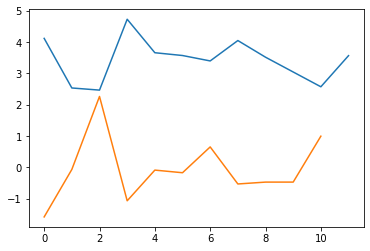

In [324]:
rg=regions[0]
rg_int= rg['N_ints']
bud1.mask=False
bud1.build_static_mask(
    np.isin(NG2G.rg_array(Nmask,method='nearest'),rg_int)*np.isfinite(G.mask))
all_mask = G.mask.copy()
all_mask[~np.isin(NG2G.rg_array(Nmask,method='nearest'),rg_int)] = np.nan
plt.plot(np.nansum(all_min*G.area[None,:,:]*all_mask*pscale,axis=(1,2)))
plt.plot(np.diff(np.nansum(all_min*G.area[None,:,:]*all_mask*pscale,axis=(1,2))))
rg['label']

(150.0, 250.0)

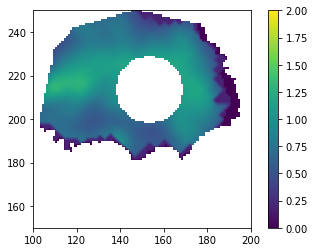

In [300]:
plt.imshow(all_min[1]*all_mask,vmin=0.0,vmax=2.0)
plt.colorbar()
plt.xlim([100,200])
plt.ylim([150,250])

In [461]:
pscale = 1e-12
# ng =regions[1]
for rg in regions[:4]:
    rg_int= rg['N_ints']
    bud1.mask=False
    bud1.build_static_mask(
        np.isin(NG2G.rg_array(Nmask,method='nearest'),rg_int)*np.isfinite(G.mask))
    all_mask = G.mask.copy()
    all_mask[~np.isin(NG2G.rg_array(Nmask,method='nearest'),rg_int)] = np.nan
    Y = np.diff(np.nansum(all_min*all_mask*G.area[None,:,:]*G.mask*pscale,axis=(1,2)))
    X= []
    var_list = ['intensification','advection','divergence','dynamics','residual','MIZ']
    var_l = ['int.','adv.','div.','res.','dyn','MIZ','Gates']
#     var_list = ['intensification','advection','divergence','residual','MIZ']
#     var_l = ['int.','adv.','div.','res.','MIZ','Gates']
#     var_list = ['intensification']
#     var_l = ['int.']
    var_list = ['intensification','MIZ']
    var_l = ['int.','MIZ',]
#     var_l = ['int.','MIZ','Gates']
#     var_list = ['intensification']
#     var_l = ['int.','Gates']
    labels = [var+GM for var in var_l for GM in ['_Grow','_Melt']]
    for var in var_list:
        bud1.set_var(var)
        for prd in [0,1]:
            dtemp,plot_temp = bud1.mean_series(periods= [prd],year_set=[2011,2021],year_form='year',
                                               method='sum',mult_array=G.area*pscale,mask=True)
            X.append(plot_temp)
#             X.append(plot_temp - np.mean(plot_temp))
    #         print(le(plot_temp))
    ### GATES
    clines = [plt.cm.jet(int(p)) for p in np.linspace(0,256,len(rg['gates']))]
    for prd in [0,1]:
        all_gates_all = []
        all_gates_s = []
        for gl,gls,cl in zip(rg['gates'],rg['gates_sign'],clines):
            gl.set_var('transport_y')
            ### for each sum all gates
            dtemp,plot_temp = gl.mean_series(periods= [prd],year_set=[2011,2021],year_form='year',method='sum',
                                       mult_array=gls*gl.G.xdist*pscale/2)
            all_gates_all.append(plot_temp)
        if 'Gates' in var_l: X.append(np.sum(all_gates_all,axis=0))
    ### load the min/max volumes, then take each seasons mean comp, do the anomaly, then multi-lin regress
    ### Y is the min vol change per year
    ### X is all the components in order (G/M) , int, adv, div, res, transp
    regr = LR_complete(np.vstack(X).T,Y,labels=labels)
    print(rg['label'])
    print(regr[0],regr[2])
    print(regr[1])
#     plt.plot(Y)
#     plt.plot(np.vstack(X).T)
#     plt.show()

Building new mask array
Basin
0.9586877926257904 0.931146321042984
   Variables  Coeffs.  Std. Errs  t values      R_sq  Prob.  Log10 Prob.
0  Intercept   2.6865      0.727     3.694  0.000000  0.008       -2.113
1  int._Grow   0.7352      0.177     4.162  0.250645  0.004       -2.374
2  int._Melt   0.9678      0.124     7.808  0.659307  0.000       -3.973
3   MIZ_Grow   0.7276      0.984     0.740  0.151604  0.484       -0.316
4   MIZ_Melt   1.6542      0.357     4.631  0.421634  0.002       -2.621
Building new mask array
Beaufort_Chukchi
0.9505250363089784 0.9175417271816307
   Variables  Coeffs.  Std. Errs  t values      R_sq  Prob.  Log10 Prob.
0  Intercept   0.1678      0.100     1.679  0.000000  0.137       -0.863
1  int._Grow   1.3425      0.201     6.663  0.002254  0.000       -3.542
2  int._Melt   1.2980      0.128    10.113  0.164481  0.000       -4.702
3   MIZ_Grow  -0.4326      1.239    -0.349  0.057937  0.737       -0.132
4   MIZ_Melt   1.8372      0.436     4.213  0.03923

Building new mask array
Basin
0.7017518445139266 0.6271898056424082
        Variables  Coeffs.  Std. Errs  t values      R_sq  Prob.  Log10 Prob.
0       Intercept   0.0419      0.850     0.049  0.000000  0.962       -0.017
1  res._Grow-Melt   0.6309      0.261     2.420  0.116864  0.039       -1.413
2   MIZ_Grow-Melt   1.8102      0.457     3.961  0.483482  0.003       -2.482


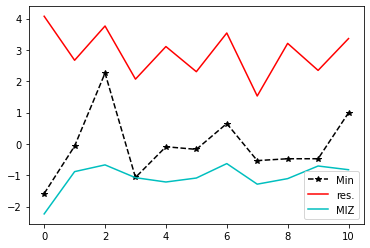

Building new mask array
Beaufort_Chukchi
0.05828454891354096 -0.17714431385807372
        Variables  Coeffs.  Std. Errs  t values      R_sq  Prob.  Log10 Prob.
0       Intercept   0.0881      0.152     0.581  0.000000  0.576       -0.240
1  res._Grow-Melt  -0.0366      0.359    -0.102  0.031456  0.921       -0.036
2   MIZ_Grow-Melt   0.3374      0.707     0.477  0.057063  0.644       -0.191


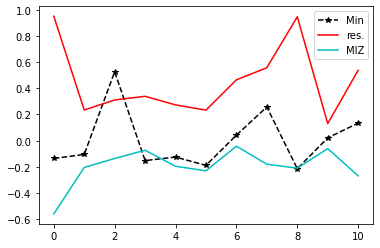

Building new mask array
Siberian_Laptev_Kara
0.6855243311455803 0.6069054139319754
        Variables  Coeffs.  Std. Errs  t values      R_sq  Prob.  Log10 Prob.
0       Intercept   0.2229      0.405     0.550  0.000000  0.595       -0.225
1  res._Grow-Melt   0.2233      0.212     1.052  0.047512  0.320       -0.495
2   MIZ_Grow-Melt   1.1536      0.286     4.029  0.642011  0.003       -2.526


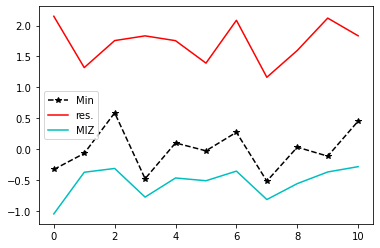

Building new mask array
Central
0.8380745397413188 0.7975931746766486
        Variables  Coeffs.  Std. Errs  t values      R_sq  Prob.  Log10 Prob.
0       Intercept   0.4518      0.233     1.942  0.000000  0.084       -1.075
1  res._Grow-Melt   0.7075      0.146     4.836  0.396133  0.001       -3.034
2   MIZ_Grow-Melt   4.0532      0.867     4.673  0.364639  0.001       -2.934


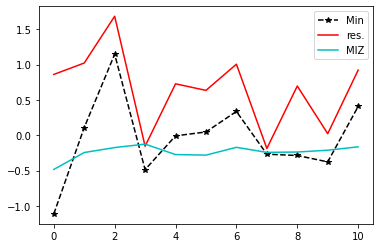

In [457]:
pscale = 1e-12
year_set = [2011,2021]
# ng =regions[1]
for rg in regions[:4]:
    rg_int= rg['N_ints']
    bud1.mask=False
    bud1.build_static_mask(
        np.isin(NG2G.rg_array(Nmask,method='nearest'),rg_int)*np.isfinite(G.mask))
    all_mask = G.mask.copy()
    all_mask[~np.isin(NG2G.rg_array(Nmask,method='nearest'),rg_int)] = np.nan
    Y = np.diff(np.nansum(all_min*all_mask*G.area[None,:,:]*G.mask*pscale,axis=(1,2)))
#     Y=Y[1:]
    X= []
#     var_list = ['intensification','advection','divergence','dynamics','residual','MIZ']
#     var_l = ['int.','adv.','dive.','dyn.','res.','MIZ','Gates']
#     var_list = ['intensification','advection','divergence','residual','MIZ']
#     var_l = ['int.','adv.','dive.','res.','MIZ','Gates']
#     var_list = ['advection','divergence','residual','MIZ']
#     var_l = ['adv.','dive.','res.','MIZ','Gates']
#     var_list = ['dynamics','residual','MIZ']
#     var_l = ['dyn','res.','MIZ']
#     var_l = ['dyn','res.','MIZ','Gates']
#     var_list = ['intensification','MIZ']
#     var_l = ['int.','MIZ']
    var_l = ['int.','MIZ','Gates']
    var_list = ['residual','MIZ']
    var_l = ['res.','MIZ']
#     var_l = ['res.','MIZ','Gates']
#     var_list = ['intensification']
#     var_l = ['int.','Gates']
    labels = [var+GM for var in var_l for GM in ['_Grow-Melt']]
    for var in var_list:
        bud1.set_var(var)
        XGM = []
        for prd in [0,1]:
            dtemp,plot_temp = bud1.mean_series(periods= [prd],year_set=year_set,year_form='year',
                                               method='sum',mult_array=G.area*pscale,mask=True)
            XGM.append(plot_temp)
#             XGM.append(plot_temp - np.mean(plot_temp))
        X.append([x+y for x,y in zip(XGM[0],XGM[1])])
    #         print(le(plot_temp))

    ### GATES
    XGM = []
    clines = [plt.cm.jet(int(p)) for p in np.linspace(0,256,len(rg['gates']))]
    for prd in [0,1]:
        all_gates_all = []
        all_gates_s = []
        for gl,gls,cl in zip(rg['gates'],rg['gates_sign'],clines):
            gl.set_var('transport_y')
            ### for each sum all gates
            dtemp,plot_temp = gl.mean_series(periods= [prd],year_set=year_set,year_form='year',method='sum',
                                       mult_array=gls*gl.G.xdist*pscale/2)
            all_gates_all.append(plot_temp)
        XGM.append(np.sum(all_gates_all,axis=0))
    if 'Gates' in var_l: X.append([x+y for x,y in zip(XGM[0],XGM[1])])
    ### load the min/max volumes, then take each seasons mean comp, do the anomaly, then multi-lin regress
    ### Y is the min vol change per year
    ### X is all the components in order (G/M) , int, adv, div, res, transp
    regr = LR_complete(np.vstack(X).T,Y,labels=labels)
    print(rg['label'])
    print(regr[0],regr[2])
    print(regr[1])
    lcolors = ['r', 'c','m', 'g','b','k']
    plt.plot(Y,'*--k')
    [plt.plot(p,l) for p,l in zip(X,lcolors)]
    plt.legend(['Min']+var_l)
    plt.show()

In [ ]:
### seasonal: but growth - melt (under/over producing)
### grow: oct - march inclusive
### melt: apr - sept inclusive
### grow - melt
clines = [plt.cm.jet(int(p)) for p in np.linspace(0,256,len(rg['gates']))]
lines=[]
years=[]
line_colors=[]
t_set=[]
# t_set=[1,22]
line_labels = []
show_plot = True
plot_type='.pdf'
plot_label = 'Season_diff_bud_exports_all'
bcolors = ['r','m','c']
nbars = 5
nyrs = bud1.nyrs ### cut off 2010 (incomplete)
yplot0 = [y for y in bud1.years[1:]+[2020]]
yplot = [y-0.5+1/nbars/2 for y in yplot0]
yplot.append(yplot[-1]+1)
bspan = 1/nbars ### 3 columns per year
mlabel_step = 2
nrows = len(regions)
ydim = 8
pscale = 1e-12
ts = bud1.dates[0]
te = bud1.dates[-1]
f= plt.figure(figsize=(12,ydim))
for nr,rg in enumerate(regions[:]):
    minmax_d = [0.0,0.0]
    axlist_d = []
    bud1.mask=False
    rg_int= rg['N_ints']
    bud1.build_static_mask(
        np.isin(NG2G.rg_array(Nmask,method='nearest'),rg_int)*np.isfinite(G.mask))
    print(rg['label'])
#     ba.bud1get_clim_lines(bud1,9,12,G)#,extend_div=True
#               ,years=[year_plus,year_mins],line_colors=['b','r'],line_labels = ['AO+','AO-']
#                         )
#     pscale = 1e-12*60*60*24
    #### first plot, big variables
    ax = f.add_subplot(nrows,1,nr+1)
    #### year seperation lines
    [ax.axvline(y+0.5,color='k',alpha = 0.5) for y in yplot0]
    ax.set_xlim([yplot0[0]-0.5,yplot0[-1]+1.5])
    for n, (var, cl) in enumerate(zip(['intensification','residual','divergence'],bcolors)):
        bud1.set_var(var)
#         bud1.data *= np.array(bud1.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
#         dtemp,plot_temp = bud1.mean_series(time_set=t_set,method='sum',mask=True,
#                                         mult_array=G.xdist*G.ydist*pscale)
        #### split into grow/melt
        ### Grow example [dtemp[y*12:y*12+6] for y in range(bud1.nyrs-1)]
#         bplot = [np.nansum(plot_temp[y*12:y*12+6]) + np.nansum(plot_temp[y*12+6:y*12+12])
#         bplot = [np.nansum(plot_temp[y*12:y*12+12])
        bplot = [np.nansum(bud1[y]*G.area[None,:,:]*pscale)
                   for y in range(bud1.nyrs)]
        bplot.append(np.mean(bplot))
        b = ax.bar([y+n*bspan for y in yplot],bplot,width=bspan,color=cl)
#         l, = ax.plot_date(dtemp,plot_temp,linestyle='-',color = cl,marker='',linewidth = 1,label=var)#,
#     bud1.data = bud1.int_t + bud1.new_ice+bud1.old_ice
    bud1.data = bud1.res_t + bud1.new_ice+bud1.old_ice
#     bud1.data =  bud1.new_ice+bud1.old_ice
    bplot = [np.nansum(bud1[y]*G.area[None,:,:]*pscale)
              for y in range(bud1.nyrs)]
    bplot.append(np.mean(bplot))
    b = ax.bar([y+(n+1)*bspan for y in yplot],bplot,width=bspan,color='b')
    ax.set_title(rg['label'])
    if nr == int(nrows/2):
        ax.set_ylabel('Volume diff. Grow - Melt 10$^3$ km$^3$')
    if nr == nrows-1: 
        ax.set_xticks(yplot0+[yplot0[-1]+1])
        ax.set_xticklabels(yplot0+['Mean'])
    else:
        ax.xaxis.set_ticks([])
    all_mask = G.mask.copy()
    all_mask[~np.isin(NG2G.rg_array(Nmask,method='nearest'),rg_int)] = np.nan
#     vol_diff = np.diff(np.nansum(all_min*G.area[None,:,:]*all_mask,axis=(1,2))*pscale)
    vol_diff = np.nansum(all_min*G.area[None,:,:]*all_mask,axis=(1,2))*pscale
    vol_diff = vol_diff-np.nanmean(vol_diff)
    ax.plot([yplot0[0] - 0.5]+[y+0.5 for y in yplot0],
            vol_diff,'-*k')
    #### second is dynamics
#     ax = f.add_subplot(nrows,1,2)
#     for n, (var, cl) in enumerate(zip(['divergence','advection','dynamics'],['b','r','m'])):
#         axlist_d.append(ax)
#         bud1.set_var(var)
#         bud1.data *= np.array(bud1.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
#         dtemp,plot_temp = bud1.mean_series(time_set=t_set,method='sum',mask=True,
#                                         mult_array=G.xdist*G.ydist*pscale)
#         l, = ax.plot_date(dtemp,plot_temp,linestyle='-',color = cl,marker='',linewidth = 1,label=var)#,
#         minmax_d[0] = np.minimum(minmax_d[0],np.min(plot_temp))
#         minmax_d[1] = np.maximum(minmax_d[1],np.max(plot_temp))
    
#     ax.legend()
#     ax.set_ylabel('Volume change 10$^6$ km$^3$')
#     ax.xaxis.set_ticks([])
#     #### all the gates too
#     clines = [plt.cm.jet(int(p)) for p in np.linspace(0,256,len(rg['gates']))]
#     ax = f.add_subplot(3,1,3)
#     axlist_d.append(ax)
#     rg['gates']
#     gsum = []
    all_gates_all = []
    for gl,gls,cl in zip(rg['gates'],rg['gates_sign'],clines):
        ### for each sum all gates
        gl.set_var('transport_x')
    # bud1.data *= np.array(bud1.days_per_slice)[:,None,None]
#         dtemp,plot_temp = gl.mean_series(method='sum',
#                                    mult_array=gls*gl.G.xdist*pscale/2)
        plot_temp = np.nansum(gl.transport_y*gl.G.xdist[None,:,:],axis=(1,2))/2*pscale*gls
#         bplot = [np.nansum(bud1[y*12:y*12+12]*G.xdist[None,:,:]*G.ydist[None,:,:]*pscale)
        all_gates_all.append(plot_temp)
    bplot = [bp for bp in np.nansum(all_gates_all,axis = 0)]
#     bplot = [np.nansum(plot_temp[y*12:y*12+6]) + np.nansum(plot_temp[y*12+6:y*12+12])
    bplot.append(np.mean(bplot))
    b = ax.bar([y+(nbars-1)*bspan for y in yplot],bplot,width=bspan,color='k')
    minmax = ax.get_ylim()
    ymax = np.maximum(-minmax[0],minmax[1])*1.05
    ax.set_ylim([-ymax,ymax])
#     l, = ax.plot_date(dtemp,np.nansum(all_gates_all,axis = 0),linestyle = '-',color = 'k',
#                       marker='',linewidth= 2,label = 'All gates')

#     #     ax.legend(lines,['Mean']+line_labels)
#     ax.set_ylabel('Ice export 10$^3$ km$^3$')
#     ax.legend()
#     #         ax.legend(lines)
#     #     ax.set_title(gl.name)
# #     ax.axes.set_xlim([0,nmonths-1])
#     for ax in axlist_d: 
#         ax.set_ylim(minmax_d)
#         ax.set_xlim([ts,te])
f.subplots_adjust(hspace=0.3)
# f.savefig(save_dir+plot_label+plot_type,bbox_inches='tight')
plt.show()

    

In [283]:
### as above but the whole time series - SINGLE REGION ANIMATED
from matplotlib.backends.backend_agg import FigureCanvasAgg 
years=[]
line_colors=[]
t_set=[]
line_labels = []
show_plot = True
plot_type='.pdf'
plot_label = 'Full_time_bud_exports_'
mlabel_step = 2
extend_div= False
mstart = 9
nmonths = 12
nrows = 3
ydim = 8
pscale = 1e-12
rg = regions[0]
# minmax_d = [0.0,0.0]
ts = bud.dates[0]
te = bud.dates[-1]
minmax_d = [-0.6,0.6]
axlist_d = []
bud1.mask=False
rg_int= rg['N_ints']
bud1.build_static_mask(
    np.isin(NG2G.rg_array(Nmask,method='nearest'),rg_int))
print(rg['label'])
#     ba.budget_clim_lines(bud1,9,12,G)#,extend_div=True
#               ,years=[year_plus,year_mins],line_colors=['b','r'],line_labels = ['AO+','AO-']
#                         )
#     pscale = 1e-12*60*60*24
def plot_now(ts,te,d):
    f= plt.figure(figsize=(12,ydim))
    canvas = FigureCanvasAgg(f)
    #### find t_set from ts,d
    t_set = [bud.get_index(du) for du in [ts,d]]
    #### first plot, big variables
    ax = f.add_subplot(nrows,1,1)
    ax.set_title(d.strftime('%b %Y'))
    for n, (var, cl) in enumerate(zip(['intensification','residual'],['b','r'])):
        bud.set_var(var)
        bud.data *= np.array(bud.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
        dtemp,plot_temp = bud.mean_series(time_set=t_set,method='sum',mask=True,
                                        mult_array=G.xdist*G.ydist*pscale)
        l, = ax.plot_date(dtemp,plot_temp,linestyle='-',color = cl,marker='',linewidth = 1,label=var)#,
    ax.set_xlim([ts,te])
    ax.legend()
    ax.set_ylabel('Volume change 10$^6$ km$^3$')
    ax.xaxis.set_ticks([])
    #### second is dynamics
    ax = f.add_subplot(nrows,1,2)
    for n, (var, cl) in enumerate(zip(['divergence','advection','dynamics'],['b','r','m'])):
        axlist_d.append(ax)
        bud.set_var(var)
        bud.data *= np.array(bud.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
        dtemp,plot_temp = bud.mean_series(time_set=t_set,method='sum',mask=True,
                                        mult_array=G.xdist*G.ydist*pscale)
        l, = ax.plot_date(dtemp,plot_temp,linestyle='-',color = cl,marker='',linewidth = 1,label=var)#,
        minmax_d[0] = np.minimum(minmax_d[0],np.min(plot_temp))
        minmax_d[1] = np.maximum(minmax_d[1],np.max(plot_temp))

    ax.legend()
    ax.set_ylabel('Volume change 10$^6$ km$^3$')
    ax.xaxis.set_ticks([])
    #### all the gates too
    clines = [plt.cm.jet(int(p)) for p in np.linspace(0,256,len(rg['gates']))]
    ax = f.add_subplot(3,1,3)
    axlist_d.append(ax)
    rg['gates']
    gsum = []
    all_gates_all = []
    for gl,gls,cl in zip(rg['gates'],rg['gates_sign'],clines):
        ### for each sum all gates
        gl.set_var('transport_x')
    # bud.data *= np.array(bud.days_per_slice)[:,None,None]
        dtemp,plot_temp = gl.mean_series(method='sum',time_set=t_set,
                                   mult_array=gls*gl.G.xdist*pscale/2)
        l, = ax.plot_date(dtemp,plot_temp,linestyle = '-',color = cl,
                          marker='',linewidth= 1,label=gl.name)
        lines.append(l)
        all_gates_all.append(plot_temp)
    l, = ax.plot_date(dtemp,np.nansum(all_gates_all,axis = 0),linestyle = '-',color = 'k',
                      marker='',linewidth= 2,label = 'All gates')

    #     ax.legend(lines,['Mean']+line_labels)
    ax.set_ylabel('Ice export 10$^3$ km$^3$')
    ax.legend()
    #         ax.legend(lines)
    #     ax.set_title(gl.name)
    #     ax.axes.set_xlim([0,nmonths-1])
    for ax in axlist_d: 
        ax.set_ylim(minmax_d)
        ax.set_xlim([ts,te])
#     f.savefig(save_dir+plot_label+'clim_lines'+rg['label']+plot_type,bbox_inches='tight')
#     if show_plot: plt.show()
    
    canvas.draw()
    s, (width, height) = canvas.print_to_buffer()

# Option 2a: Convert to a NumPy array.
    image = np.fromstring(s, np.uint8).reshape((height, width, 4))
    i_m,i_n,iii = image.shape
    ### remove outer x%
    cl_p = 0.09
    m_cl = int(i_m*cl_p)
    n_cl = int(i_n*cl_p)
    image = image[m_cl:-m_cl+10,n_cl:-n_cl,:]
    plt.close()
    return image



Building new mask array
Basin


In [285]:
ts = bud.dates[0]
te = bud.dates[-1]
d = bud.dates[10]
# plt.imshow(image)
images = []
for d in bud.dates:
    now = d.strftime('%Y-%m-%d')
    print(now)
    # image = plot_now(ts,te,d)
    images.append(plot_now(ts,te,d))

/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:99: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:99: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:99: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:99: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:99: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use

In [287]:
import imageio

fps_set = 2
gfile = save_dir+plot_label+'clim_lines'+rg['label']+'.gif'
imageio.mimsave(gfile, images, fps=fps_set)

In [248]:

ys = [3,6]
'_'.join([str(bud.years[y]) for y in ys]+['bud_bars_'])

'2013_2016_bud_bars_'

(0.0, 11.0)

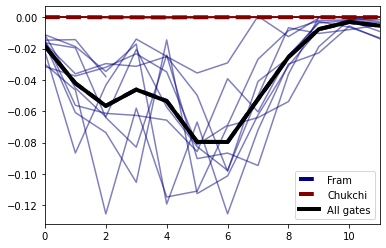

In [93]:

clines = [plt.cm.jet(int(p)) for p in np.linspace(0,256,len(rg['gates']))]
f= plt.figure()
ax = f.add_subplot(1,1,1)
rg['gates']
gsum = []
all_gates_all = []
for gl,cl in zip(rg['gates'],clines):
    ### for each sum all gates
    gl.set_var('transport_x')
# bud.data *= np.array(bud.days_per_slice)[:,None,None]
    plot_temp = gl.clim_mean(first_p=mstart,method='ysum',full_time=True,time_set=t_set,
                               mult_array=gl.G.xdist*pscale/2)
    l, = ax.plot(np.array(plot_temp),linestyle = '--',color = cl,linewidth= 4,label=gl.name)
    lines.append(l)
    all_gates_all.append(plot_temp)

    #### loop over all the years
    for y in range(gl.nyrs):
        if not gl.yrpd.mask[y,mstart]:
            t_p = gl.yrpd[y,mstart]
            plot_temp = np.nansum(gl[t_p:t_p+nmonths]*gl.G.xdist[None,:,:]*pscale/2,axis=(1,2))
            l, = ax.plot(plot_temp,color = cl,alpha= 0.5)

l, = ax.plot(np.nansum(all_gates_all,axis = 0),'-k',linewidth= 4,label = 'All gates')
    
#     ax.legend(lines,['Mean']+line_labels)
ax.legend()
#         ax.legend(lines)
#     ax.set_title(gl.name)
ax.axes.set_xlim([0,nmonths-1])
#     if np.mod(n,ncols) ==0:
#         ax.set_ylabel('Volume change 10$^6$ km$^3$')
#     if n>=(nrows-1)*ncols:
#         ax.xaxis.set_ticks(range(0,nmonths))
#         ax.xaxis.set_ticklabels(mstr)
#     else:
#         ax.xaxis.set_ticks([])





Building new mask array
Basin


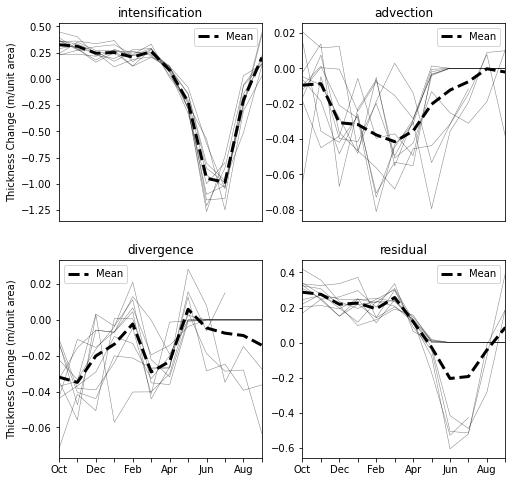

Building new mask array
Central


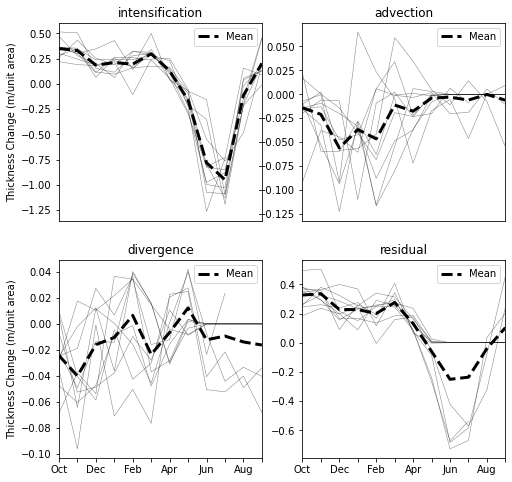

Building new mask array
Beaufort_Chukchi


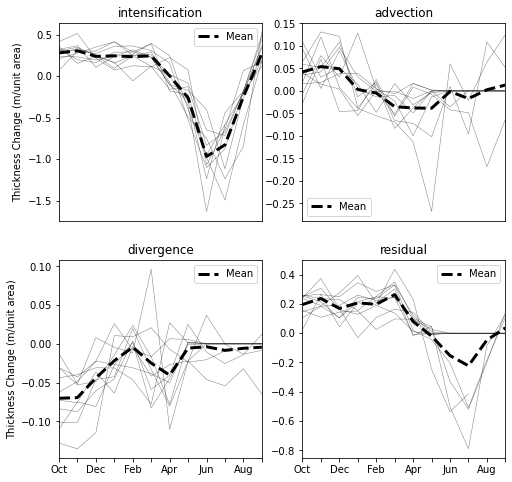

Building new mask array
Siberian_Laptev_Kara


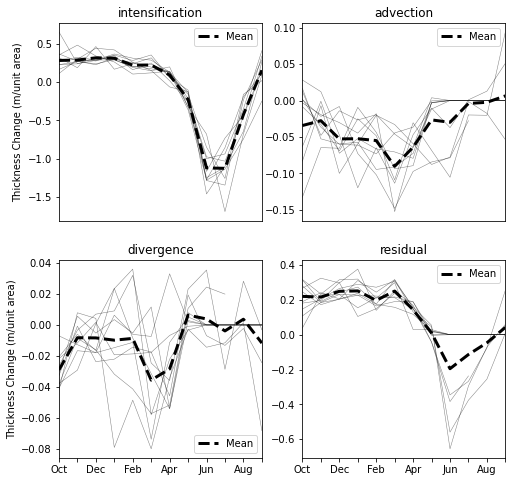

In [32]:
### lets try to normalise by area§
for rg in regions:
    bud1.mask=False
    rg_int= rg['N_ints']
    bud1.build_static_mask(
        np.isin(NG2G.rg_array(Nmask,method='nearest'),rg_int))
    print(rg['label'])
    ba.budget_clim_lines_norm(bud1,9,12,G,extend_div=False,norm_conc=True)#,
#               years=[year_plus,year_mins],line_colors=['b','r'],line_labels = ['AO+','AO-'])
    